# Первое домашнее задание. 
Мягкий дедлайн: 3 мая, жесткий дедлайн: 10 мая. 

Максимальное количество баллов - 30. 

**Задание 1** (10 баллов) 

Рассмотрите две выборки: https://archive.ics.uci.edu/ml/datasets/Shill+Bidding+Dataset и https://archive.ics.uci.edu/ml/datasets/Speaker+Accent+Recognition. Для обоих выборок постройте AdaBoost, GradientBoosting, RandomForest, Bagging. Сравните качество на обоих выборках. Отличается ли результат? Почему? 

In [55]:
import os
import pandas as pd
import numpy as np
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, \
                                GradientBoostingClassifier, BaggingClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFECV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import make_pipeline, Pipeline
import seaborn as sns
import matplotlib.pyplot as plt
from scikitplot.metrics import plot_roc
from sklearn.metrics import f1_score, accuracy_score
from IPython.display import display, Markdown
sns.set()
DATA_PATH = './data/'
shill_bidding_ds = os.path.join(DATA_PATH, 'Shill Bidding Dataset.csv')
accent_ds = os.path.join(DATA_PATH, 'accent-mfcc-data-1.csv')

assert os.path.exists(shill_bidding_ds), f"There is not such path {shill_bidding_ds}"
assert os.path.exists(accent_ds), f"There is not such path {accent_ds}"

In [14]:
bidding_df = pd.read_csv(shill_bidding_ds)
print(bidding_df.shape)
bidding_df.sample(5)

(6321, 13)


,Record_ID,Auction_ID,Bidder_ID,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
5512,13148,2439,o***p,0.062500,0.090909,0.0,0.050532,0.00,0.000000,0.050532,0.00,7,0
461,1078,192,a***c,0.045455,0.020000,0.0,0.981678,0.64,0.993593,0.981678,0.00,5,0
2070,4945,539,d***n,0.100000,0.041667,0.0,0.330840,0.25,0.000000,0.330840,0.00,7,0
435,1020,255,i***j,0.040000,0.142857,0.0,0.000015,0.00,0.000000,0.000015,0.75,3,0
2110,5047,391,_***3,0.333333,0.142857,0.0,0.073142,0.00,0.000000,0.073142,1.00,7,0


In [15]:
bidding_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6321 entries, 0 to 6320
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Record_ID               6321 non-null   int64  
 1   Auction_ID              6321 non-null   int64  
 2   Bidder_ID               6321 non-null   object 
 3   Bidder_Tendency         6321 non-null   float64
 4   Bidding_Ratio           6321 non-null   float64
 5   Successive_Outbidding   6321 non-null   float64
 6   Last_Bidding            6321 non-null   float64
 7   Auction_Bids            6321 non-null   float64
 8   Starting_Price_Average  6321 non-null   float64
 9   Early_Bidding           6321 non-null   float64
 10  Winning_Ratio           6321 non-null   float64
 11  Auction_Duration        6321 non-null   int64  
 12  Class                   6321 non-null   int64  
dtypes: float64(8), int64(4), object(1)
memory usage: 642.1+ KB


In [16]:
bidding_df.drop(columns=["Record_ID", "Bidder_ID"], inplace=True)

Во избежание утечки данных любые гипотезы и исследования будет делать после разбиения на `train` и `test` датасеты.

In [27]:
features = bidding_df[bidding_df.columns[:-1]]
target = bidding_df["Class"]

In [28]:
X_train_pd, X_test_pd, y_train_pd, y_test_pd = train_test_split(features, target, test_size=0.25)

In [31]:
X_train_pd.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
Auction_ID,4740.0,1244.805063,733.317413,5.000000,593.000000,1244.000000,1872.000000,2538.000000
Bidder_Tendency,4740.0,0.143256,0.198477,0.000000,0.026667,0.062500,0.166667,1.000000
Bidding_Ratio,4740.0,0.128651,0.133577,0.011765,0.043478,0.083333,0.166667,1.000000
Successive_Outbidding,4740.0,0.102954,0.278004,0.000000,0.000000,0.000000,0.000000,1.000000
Last_Bidding,4740.0,0.465808,0.381174,0.000000,0.048693,0.446847,0.863525,0.999900
Auction_Bids,4740.0,0.230383,0.255057,0.000000,0.000000,0.142857,0.454545,0.788235
Starting_Price_Average,4740.0,0.469300,0.489614,0.000000,0.000000,0.000000,0.993593,0.999935
Early_Bidding,4740.0,0.433123,0.381464,0.000000,0.028273,0.364872,0.829262,0.999900
Winning_Ratio,4740.0,0.368899,0.436647,0.000000,0.000000,0.000000,0.848214,1.000000
Auction_Duration,4740.0,4.609705,2.463490,1.000000,3.000000,5.000000,7.000000,10.000000


Посмотрим на распредения и корреляции

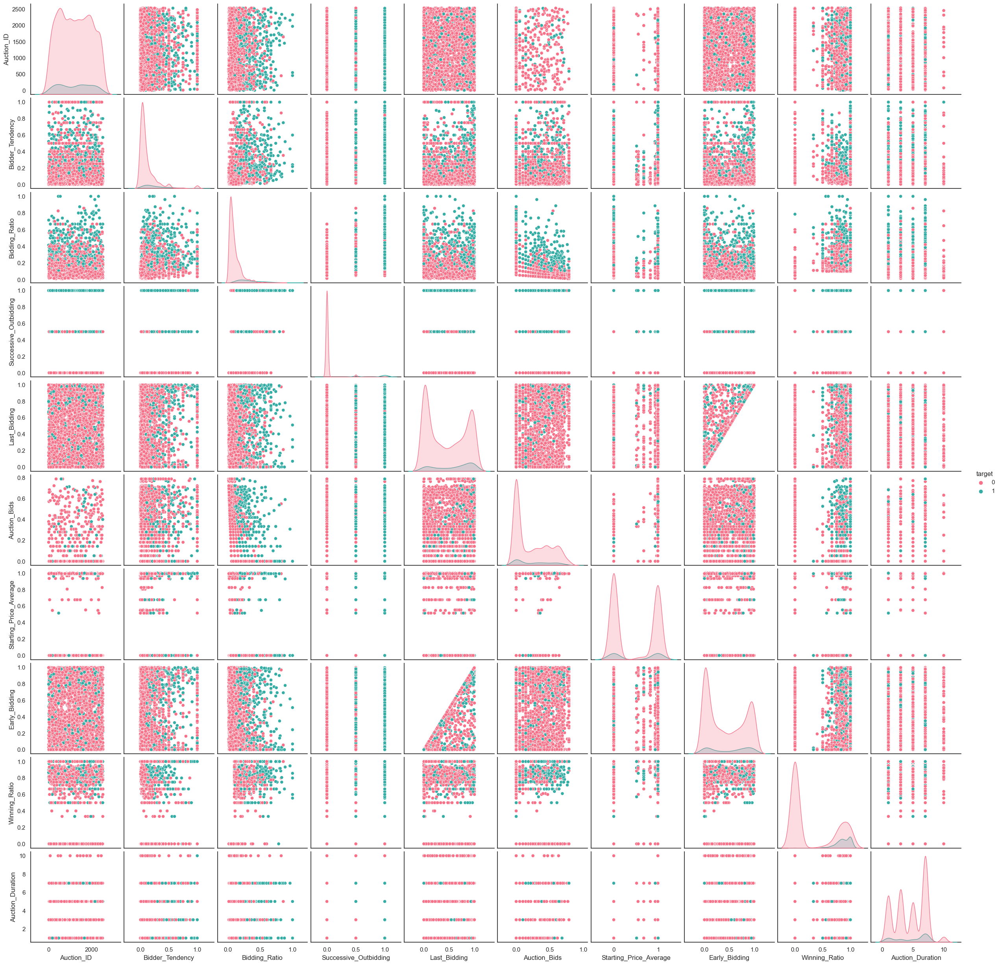

In [52]:
X_train_pd_labeled = X_train_pd.copy()
X_train_pd_labeled["target"] = y_train_pd
sns.pairplot(X_train_pd_labeled, diag_kind="kde", hue="target", palette="husl")

Можем видеть явную несбалансированность классов, что может сказаться на результатах, однако так же можно заметить, что распределения неплохо разделимы. Помимо `f1` и `accuracy_score` так же будем смотреть на `ROC-AUC` кривые.

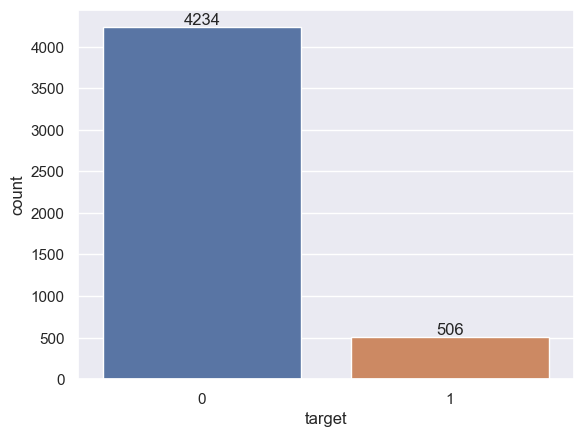

In [69]:
ax = sns.countplot(X_train_pd_labeled, x="target")
ax.bar_label(ax.containers[0]);

Посмотрим на корреляции признаков.

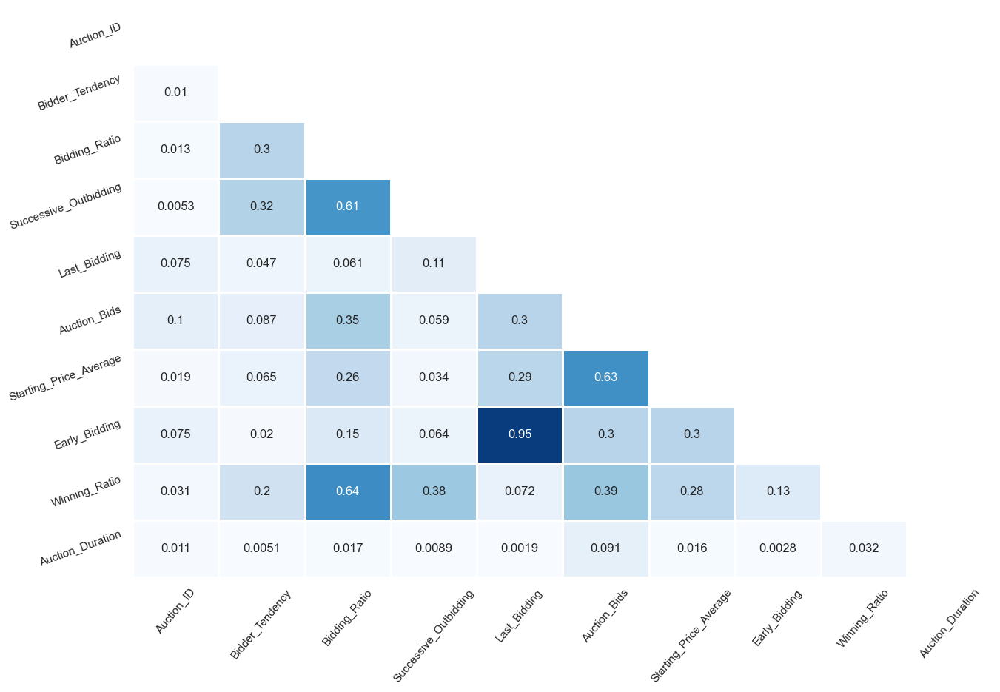

In [53]:
cor_matrix = X_train_pd.corr().abs()
lower_triangle = cor_matrix.where(np.tril(np.ones(cor_matrix.shape), k=-1).astype(bool))
plt.figure(figsize =(15,10))
sns.set_style(style='white')
sns.heatmap(lower_triangle, 
            center=0.5, cmap= 'Blues',
            annot= True, xticklabels = cor_matrix.index,
            yticklabels = cor_matrix.columns,
            cbar= False, linewidths= 1, mask =(lower_triangle==0))
plt.xticks(rotation = 50)
plt.yticks(rotation = 20) 
plt.show()

Сильно скоррелированными являются `Early_Bidding` и `Last_Bidding`. В течение обучения можно будет попробовать воспользоваться Recursive Feature Elimination, чтобы избавить от сильно скоррелированных признаков. С другой стороны, мало смысла имеет переводить в низко скоррелированное пространство с помощью PCA, потому что остальные признаки слабо коррелируют. 

In [137]:
from typing import Dict, Iterable
import sklearn
from tabulate import tabulate
def gridsearch_model(params_grid: Dict[str, Iterable], 
                     pipeline: sklearn.pipeline.Pipeline, 
                     cv: int=5, n_jobs: int=-1,
                     scoring: str="accuracy", verbose: int=2
                     ) -> sklearn.base.BaseEstimator:
    """
    Perform grid search over hyperparameters for a given machine learning model.
    
    Parameters:
    ----------
    params_grid: dict
        Dictionary of hyperparameters to search over.
    pipeline: sklearn.pipeline.Pipeline
        Scikit-learn pipeline object.
    model: sklearn.base.Estimator
        Scikit-learn estimator object.
    
    Returns:
    -------
    best_estimator: sklearn.base.Estimator
        Scikit-learn estimator object with best hyperparameters.
    """
    # Create GridSearchCV object
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=params_grid,
        cv=cv,  # 5-fold cross-validation
        n_jobs=n_jobs,  # Use all available CPU cores
        scoring=scoring,
        verbose=verbose
    )

    # Fit the grid search object to the data
    grid_search.fit(X_train_pd, y_train_pd)
    
    # Get the best estimator
    best_estimator = grid_search.best_estimator_
    df = pd.DataFrame(grid_search.best_params_, index=[pipeline.steps[-1][-1]])
    df[scoring] = grid_search.best_score_
    print(tabulate(df, headers='keys', tablefmt='psql'))
     # add printing best hyperparameters
    return best_estimator

In [138]:
# Define hyperparameter grids for each classifier
rf_params = {
    'rf__n_estimators': [10, 50, 100],
    'rf__max_depth': [None, 2, 4, 6],
    'rf__min_samples_split': [2, 4, 6],
    'rf__min_samples_leaf': [1, 2, 4],
}

ada_params = {
    'ada__n_estimators': [10, 50, 100],
    'ada__learning_rate': [0.1, 0.5, 1],
}

gb_params = {
    'gb__n_estimators': [10, 50, 100],
    'gb__learning_rate': [0.1, 0.5, 1],
    'gb__max_depth': [2, 4, 6],
}

bag_params = {
    'bag__n_estimators': [10, 50, 100],
    'bag__max_samples': [0.5, 0.8, 1.0],
    'bag__max_features': [0.5, 0.8, 1.0],
}


In [139]:
from sklearn.preprocessing import StandardScaler

# Define pipelines for each classifier
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier())
])

ada_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ada', AdaBoostClassifier())
])

gb_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('gb', GradientBoostingClassifier())
])

bag_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('bag', BaggingClassifier())
])


In [189]:
def make_confusion_matrix(cf_matrix):
    group_names = ["True Neg","False Pos","False Neg","True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in
                    cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                        cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
    plt.show()


def perform_experiment(
        params_grid: Dict[str, Iterable], 
        pipeline: sklearn.pipeline.Pipeline, 
        cv: int=5, n_jobs: int=-1,
        scoring: str="accuracy", verbose: int=2,
    ) -> sklearn.base.BaseEstimator:
    display(Markdown(f"<h2>{pipeline.steps[-1][-1]}</h2>"))
    best_clf = gridsearch_model(params_grid=params_grid,
                            pipeline=pipeline, cv=cv, n_jobs=n_jobs,
                            scoring=scoring, verbose=verbose)
    
    predicts = best_clf.predict(X_test_pd)
    print(f'f1_score = {f1_score(y_test_pd, predicts, average="micro")}')
    print(f'accuracy_score = {accuracy_score(y_test_pd, predicts)}')
    make_confusion_matrix(confusion_matrix(y_test_pd, predicts))
    clf_report = classification_report(y_test_pd, predicts, output_dict=True)
    print(tabulate(pd.DataFrame(clf_report).T, headers='keys', tablefmt='psql'))
    plot_roc(
        y_test_pd,
        best_clf.predict_proba(X_test_pd),
        figsize=(12, 8),
        title_fontsize=20,
        text_fontsize=14
    );

    return best_clf

<h2>RandomForestClassifier()</h2>

Fitting 5 folds for each of 108 candidates, totalling 540 fits
+--------------------------+-----------------+------------------------+-------------------------+--------------------+------------+
|                          | rf__max_depth   |   rf__min_samples_leaf |   rf__min_samples_split |   rf__n_estimators |   accuracy |
|--------------------------+-----------------+------------------------+-------------------------+--------------------+------------|
| RandomForestClassifier() |                 |                      1 |                       2 |                100 |   0.992827 |
+--------------------------+-----------------+------------------------+-------------------------+--------------------+------------+
f1_score = 0.9943074003795066
accuracy_score = 0.9943074003795066


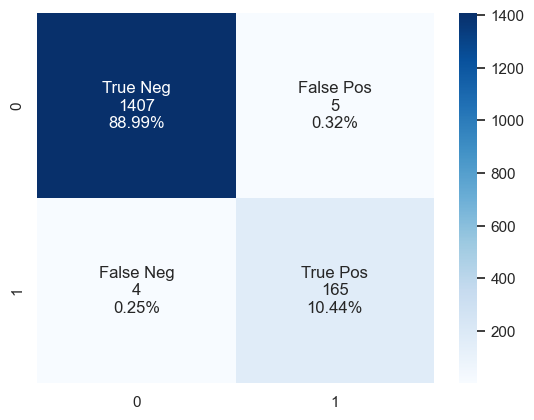

+--------------+-------------+----------+------------+-------------+
|              |   precision |   recall |   f1-score |     support |
|--------------+-------------+----------+------------+-------------|
| 0            |    0.997165 | 0.996459 |   0.996812 | 1412        |
| 1            |    0.970588 | 0.976331 |   0.973451 |  169        |
| accuracy     |    0.994307 | 0.994307 |   0.994307 |    0.994307 |
| macro avg    |    0.983877 | 0.986395 |   0.985132 | 1581        |
| weighted avg |    0.994324 | 0.994307 |   0.994315 | 1581        |
+--------------+-------------+----------+------------+-------------+


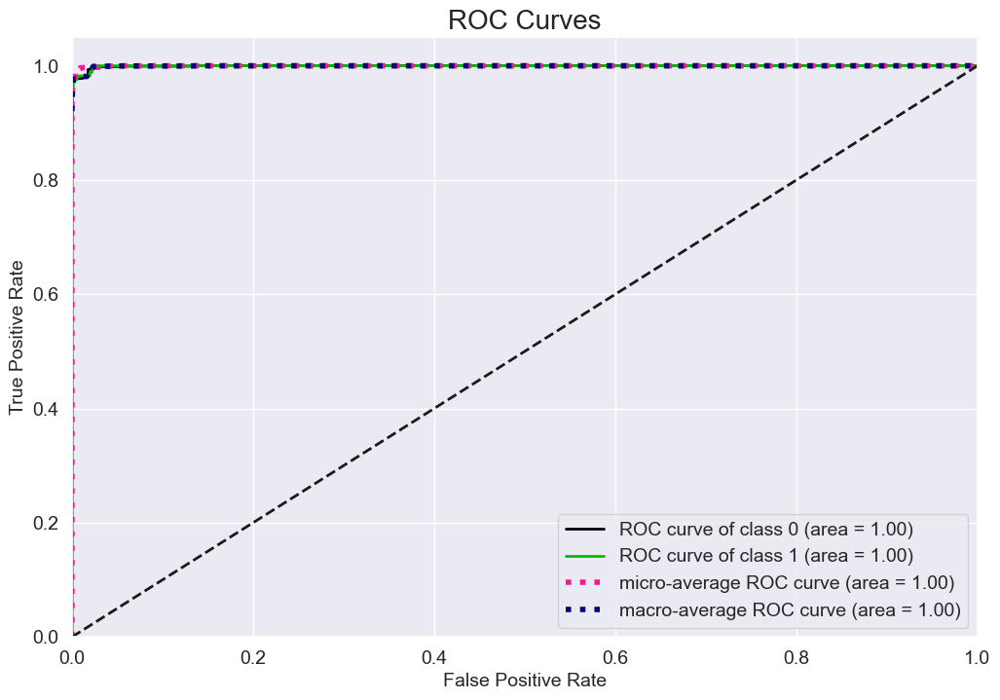

In [162]:
perform_experiment(rf_params, rf_pipeline);

<h2>AdaBoostClassifier()</h2>

Fitting 5 folds for each of 9 candidates, totalling 45 fits
+----------------------+----------------------+---------------------+------------+
|                      |   ada__learning_rate |   ada__n_estimators |   accuracy |
|----------------------+----------------------+---------------------+------------|
| AdaBoostClassifier() |                    1 |                 100 |   0.993671 |
+----------------------+----------------------+---------------------+------------+
f1_score = 0.9949399114484504
accuracy_score = 0.9949399114484504


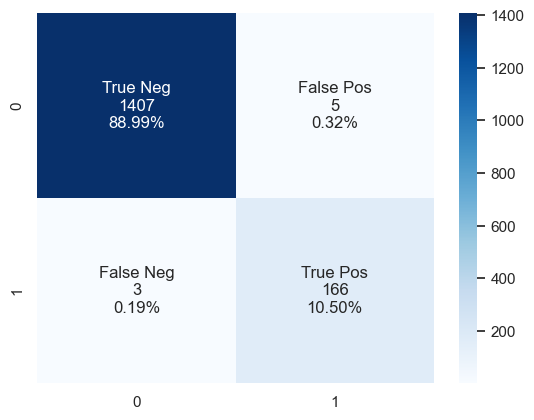

+--------------+-------------+----------+------------+------------+
|              |   precision |   recall |   f1-score |    support |
|--------------+-------------+----------+------------+------------|
| 0            |    0.997872 | 0.996459 |   0.997165 | 1412       |
| 1            |    0.97076  | 0.982249 |   0.976471 |  169       |
| accuracy     |    0.99494  | 0.99494  |   0.99494  |    0.99494 |
| macro avg    |    0.984316 | 0.989354 |   0.986818 | 1581       |
| weighted avg |    0.994974 | 0.99494  |   0.994953 | 1581       |
+--------------+-------------+----------+------------+------------+


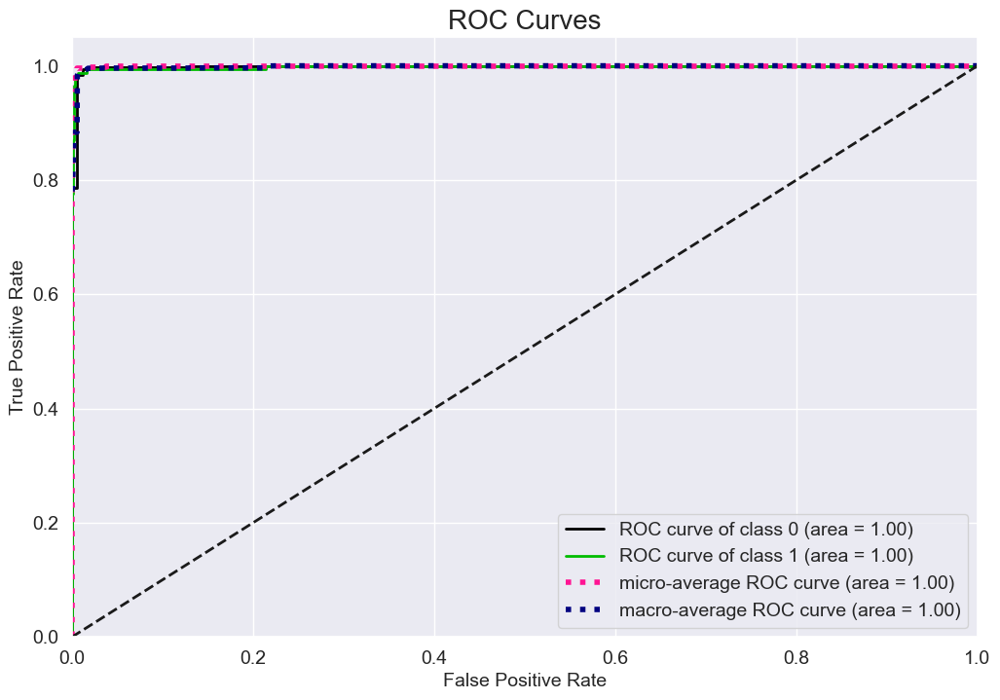

In [163]:
perform_experiment(ada_params, ada_pipeline);

<h2>GradientBoostingClassifier()</h2>

Fitting 5 folds for each of 27 candidates, totalling 135 fits
+------------------------------+---------------------+-----------------+--------------------+------------+
|                              |   gb__learning_rate |   gb__max_depth |   gb__n_estimators |   accuracy |
|------------------------------+---------------------+-----------------+--------------------+------------|
| GradientBoostingClassifier() |                 0.1 |               6 |                100 |   0.998101 |
+------------------------------+---------------------+-----------------+--------------------+------------+
f1_score = 0.9968374446552815
accuracy_score = 0.9968374446552815


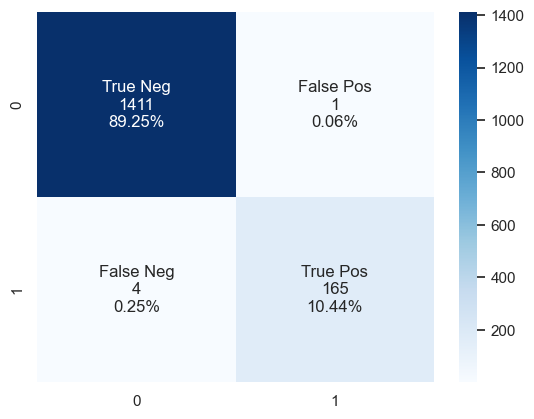

+--------------+-------------+----------+------------+-------------+
|              |   precision |   recall |   f1-score |     support |
|--------------+-------------+----------+------------+-------------|
| 0            |    0.997173 | 0.999292 |   0.998231 | 1412        |
| 1            |    0.993976 | 0.976331 |   0.985075 |  169        |
| accuracy     |    0.996837 | 0.996837 |   0.996837 |    0.996837 |
| macro avg    |    0.995575 | 0.987812 |   0.991653 | 1581        |
| weighted avg |    0.996831 | 0.996837 |   0.996825 | 1581        |
+--------------+-------------+----------+------------+-------------+


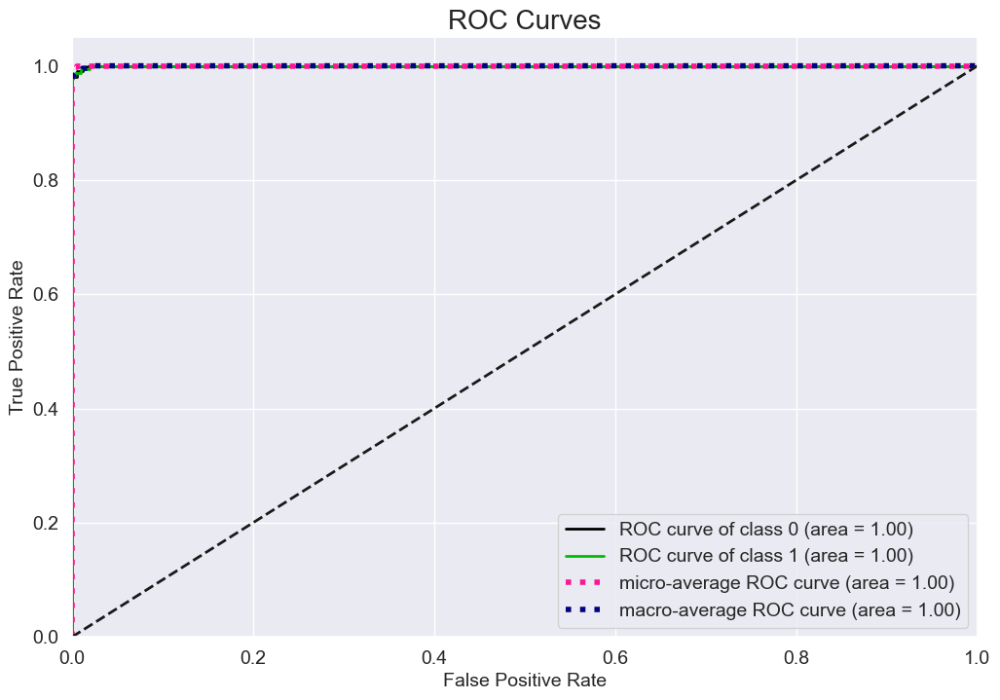

In [164]:
perform_experiment(gb_params, gb_pipeline);

<h2>BaggingClassifier()</h2>

Fitting 5 folds for each of 27 candidates, totalling 135 fits
+---------------------+---------------------+--------------------+---------------------+------------+
|                     |   bag__max_features |   bag__max_samples |   bag__n_estimators |   accuracy |
|---------------------+---------------------+--------------------+---------------------+------------|
| BaggingClassifier() |                   1 |                  1 |                 100 |   0.998312 |
+---------------------+---------------------+--------------------+---------------------+------------+
f1_score = 0.9981024667931688
accuracy_score = 0.9981024667931688


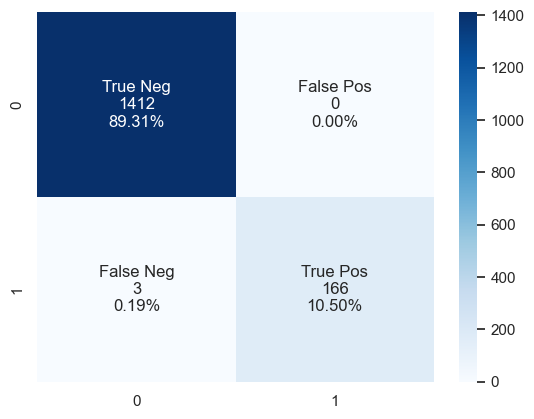

+--------------+-------------+----------+------------+-------------+
|              |   precision |   recall |   f1-score |     support |
|--------------+-------------+----------+------------+-------------|
| 0            |    0.99788  | 1        |   0.998939 | 1412        |
| 1            |    1        | 0.982249 |   0.991045 |  169        |
| accuracy     |    0.998102 | 0.998102 |   0.998102 |    0.998102 |
| macro avg    |    0.99894  | 0.991124 |   0.994992 | 1581        |
| weighted avg |    0.998106 | 0.998102 |   0.998095 | 1581        |
+--------------+-------------+----------+------------+-------------+


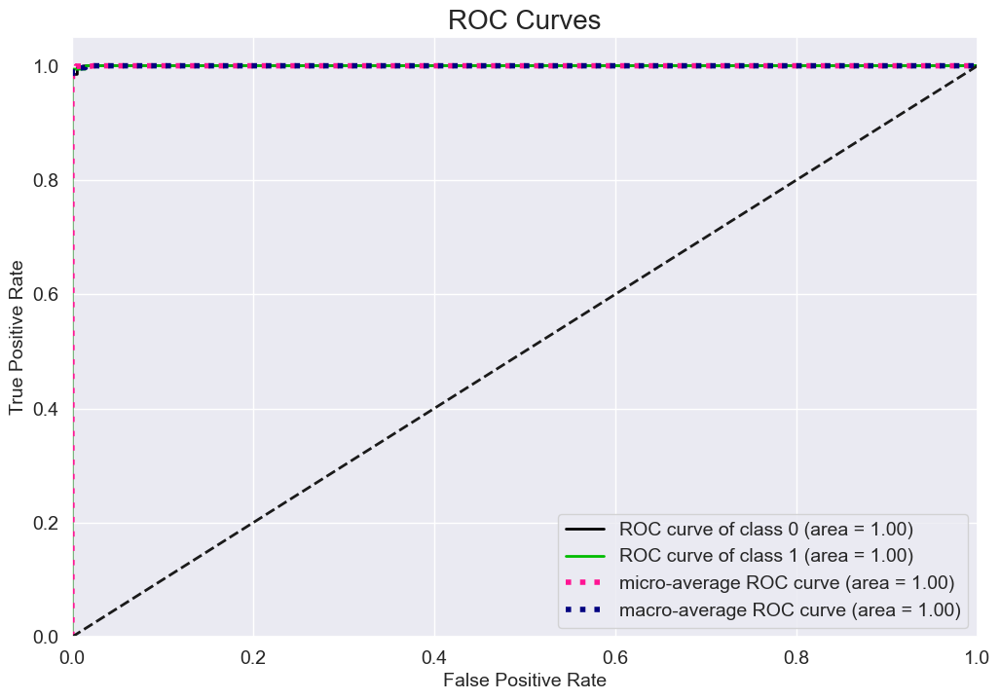

In [165]:
perform_experiment(bag_params, bag_pipeline);

Не смотря на несбалансированность классов, модели показывают хорошие результаты.

In [166]:
accent_df = pd.read_csv(accent_ds)
print(accent_df.shape)
accent_df.sample(5)

(329, 13)


,language,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12
101,IT,2.462373,-0.401984,-1.315420,7.096387,-9.708779,7.501631,-9.610044,2.721599,0.608331,-4.751264,0.583645,-1.787141
199,US,11.380513,-8.202689,2.029268,4.254329,-11.062525,9.994484,-11.833523,5.144079,-1.205391,-4.791498,6.244781,-6.287343
78,GE,0.942360,-0.518287,-1.593180,4.222678,-5.481755,10.482671,-10.698943,5.524382,1.283396,-2.067741,2.405412,-3.286886
53,FR,15.195717,-6.538510,0.864829,15.167421,-8.624122,11.053795,-6.124841,4.914569,0.596662,-7.389290,5.953790,-7.215543
258,US,9.919715,-9.496241,3.255712,9.263471,-10.744903,8.111948,-7.139747,3.510051,-0.656607,-4.831603,5.768930,-0.373324


In [167]:
from sklearn.preprocessing import LabelEncoder

In [168]:
accent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329 entries, 0 to 328
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   language  329 non-null    object 
 1   X1        329 non-null    float64
 2   X2        329 non-null    float64
 3   X3        329 non-null    float64
 4   X4        329 non-null    float64
 5   X5        329 non-null    float64
 6   X6        329 non-null    float64
 7   X7        329 non-null    float64
 8   X8        329 non-null    float64
 9   X9        329 non-null    float64
 10  X10       329 non-null    float64
 11  X11       329 non-null    float64
 12  X12       329 non-null    float64
dtypes: float64(12), object(1)
memory usage: 33.5+ KB


In [174]:
features = accent_df[accent_df.columns[1:]]
target = accent_df["language"]

In [175]:
X_train_pd, X_test_pd, y_train_pd, y_test_pd = train_test_split(features, target, test_size=0.25)

In [176]:
X_train_pd.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
X1,246.0,5.592375,5.186960,-6.067831,1.975471,4.994464,9.801095,17.749851
X2,246.0,-4.335117,3.593956,-14.972962,-6.553874,-4.343114,-1.559932,3.526736
X3,246.0,2.386574,3.537788,-6.186583,-0.032097,1.909895,4.010348,15.630876
X4,246.0,7.232706,4.223698,-8.844231,4.589591,7.714223,10.169819,16.178942
X5,246.0,-5.926069,4.400646,-15.656596,-8.528157,-6.902940,-4.772209,7.471646
X6,246.0,9.828666,3.364042,-3.528964,8.646916,10.262118,11.709916,18.777547
X7,246.0,-9.466746,2.508728,-15.365665,-11.201235,-9.676854,-8.144348,-2.243886
X8,246.0,5.093679,2.608700,-2.873862,3.450067,4.933517,6.527947,13.846083
X9,246.0,-1.134681,3.425590,-15.049185,-1.737184,-0.369786,0.649358,4.789989
X10,246.0,-2.557334,4.843096,-11.429178,-4.865962,-3.325433,-1.660397,16.326455


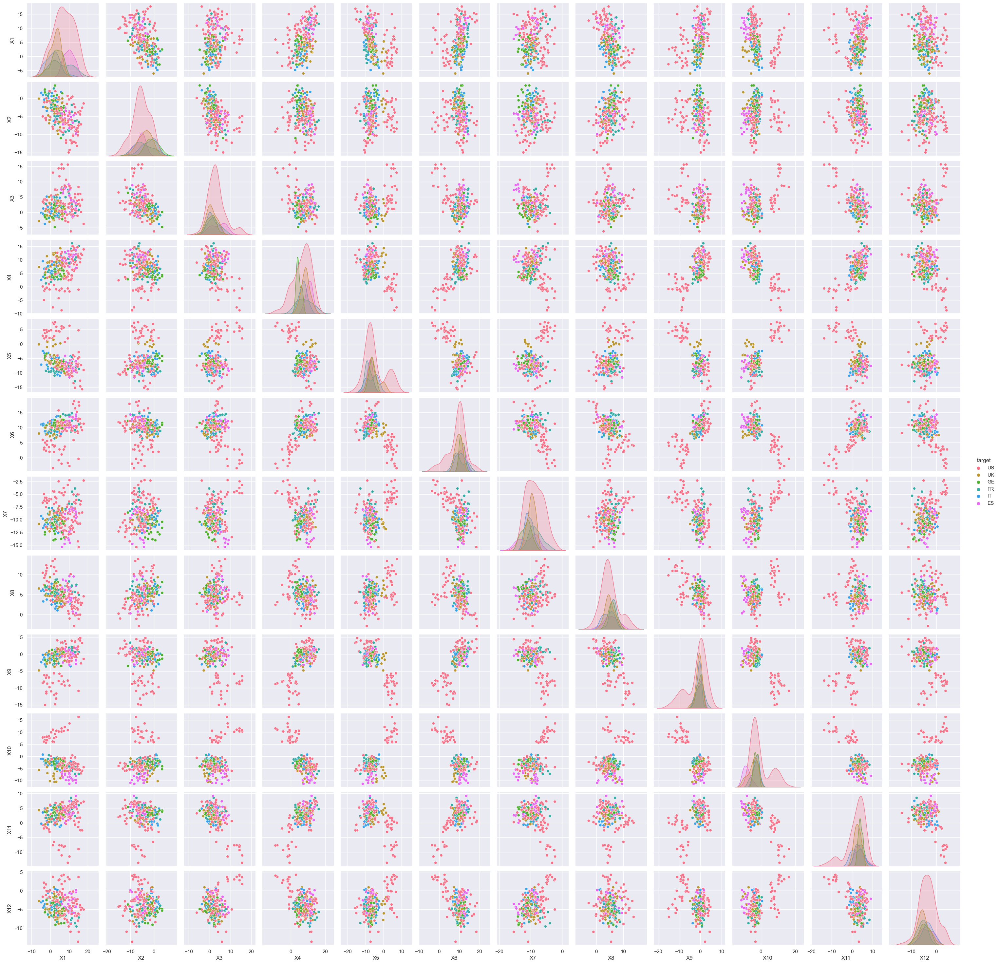

In [177]:
X_train_pd_labeled = X_train_pd.copy()
X_train_pd_labeled["target"] = y_train_pd
sns.pairplot(X_train_pd_labeled, diag_kind="kde", hue="target", palette="husl")

Видно, что классы также не сбалансированы, к тому же не так разделимы. Посмотрим на корреляции.

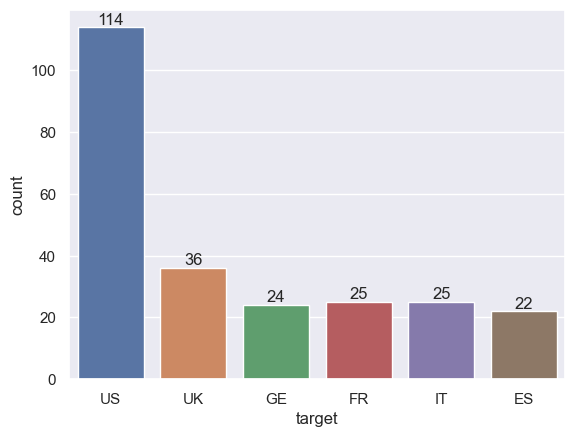

In [178]:
ax = sns.countplot(X_train_pd_labeled, x="target")
ax.bar_label(ax.containers[0]);

In [284]:
label_encoder = LabelEncoder()
y_train_pd = label_encoder.fit(y_train_pd)
y_test_pd = label_encoder.transform(y_test_pd)

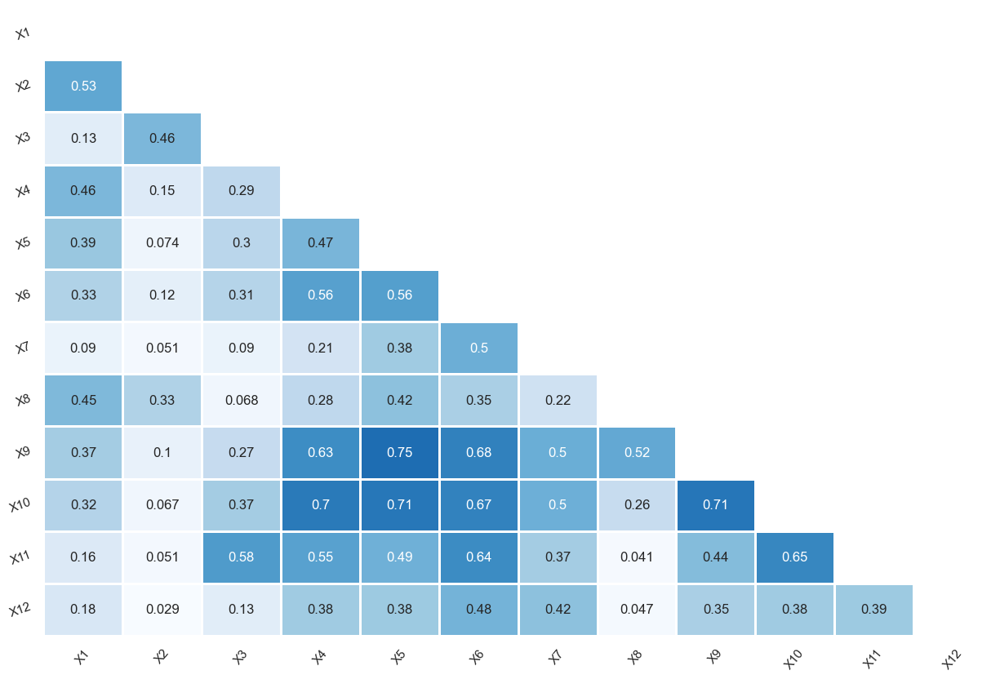

In [179]:
cor_matrix = X_train_pd.corr().abs()
lower_triangle = cor_matrix.where(np.tril(np.ones(cor_matrix.shape), k=-1).astype(bool))
plt.figure(figsize =(15,10))
sns.set_style(style='white')
sns.heatmap(lower_triangle, 
            center=0.5, cmap= 'Blues',
            annot= True, xticklabels = cor_matrix.index,
            yticklabels = cor_matrix.columns,
            cbar= False, linewidths= 1, mask =(lower_triangle==0))
plt.xticks(rotation = 50)
plt.yticks(rotation = 20) 
plt.show()

In [296]:
def make_confusion_matrix(cf_matrix):
    num_classes = cf_matrix.shape[0]
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v2}\n{v3}" for v2, v3 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape((num_classes, num_classes))
    sns.heatmap(cf_matrix, 
                annot=labels, 
                fmt="", cmap="Blues", 
                xticklabels=label_encoder.classes_,
                yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()

In [338]:
# Define pipelines for each classifier
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier())
])

ada_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ada', AdaBoostClassifier())
])

gb_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('gb', GradientBoostingClassifier())
])

bag_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('bag', BaggingClassifier())
])


<h2>RandomForestClassifier()</h2>

Fitting 5 folds for each of 108 candidates, totalling 540 fits
+--------------------------+-----------------+------------------------+-------------------------+--------------------+------------+
|                          | rf__max_depth   |   rf__min_samples_leaf |   rf__min_samples_split |   rf__n_estimators |   accuracy |
|--------------------------+-----------------+------------------------+-------------------------+--------------------+------------|
| RandomForestClassifier() |                 |                      1 |                       2 |                100 |   0.780571 |
+--------------------------+-----------------+------------------------+-------------------------+--------------------+------------+
f1_score = 0.8313253012048193
accuracy_score = 0.8313253012048193


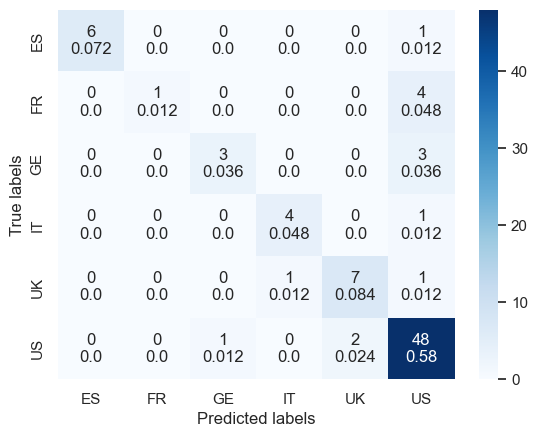

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    1        | 0.857143 |   0.923077 |  7        |
| 1            |    1        | 0.2      |   0.333333 |  5        |
| 2            |    0.75     | 0.5      |   0.6      |  6        |
| 3            |    0.8      | 0.8      |   0.8      |  5        |
| 4            |    0.777778 | 0.777778 |   0.777778 |  9        |
| 5            |    0.827586 | 0.941176 |   0.880734 | 51        |
| accuracy     |    0.831325 | 0.831325 |   0.831325 |  0.831325 |
| macro avg    |    0.859227 | 0.67935  |   0.719154 | 83        |
| weighted avg |    0.839842 | 0.831325 |   0.815008 | 83        |
+--------------+-------------+----------+------------+-----------+


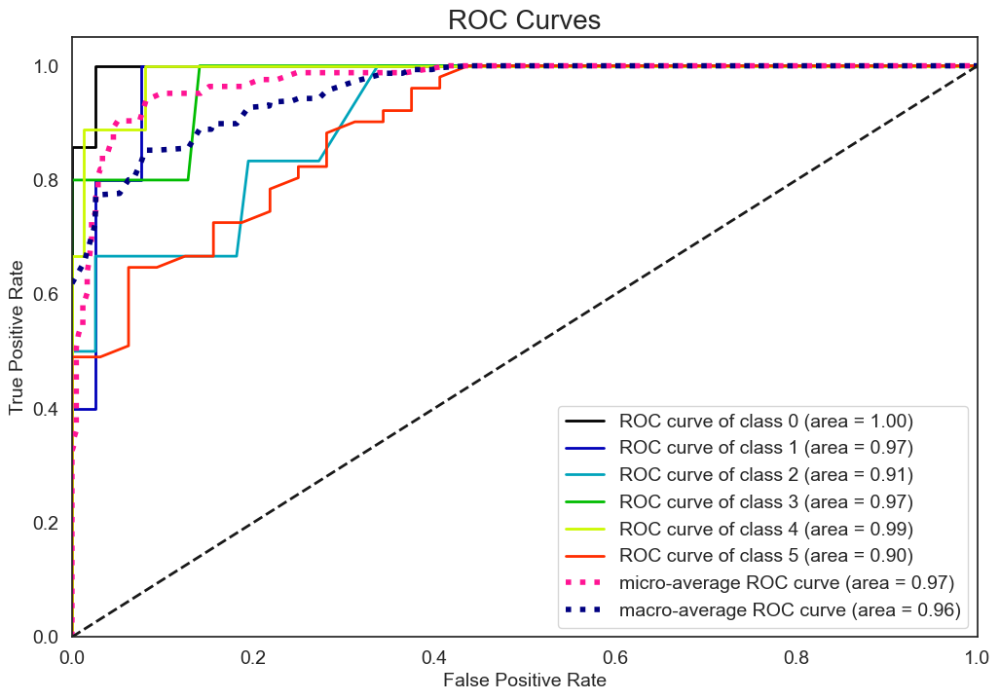

In [341]:
rf_clf = perform_experiment(rf_params, rf_pipeline);

<h2>AdaBoostClassifier()</h2>

Fitting 5 folds for each of 9 candidates, totalling 45 fits
+----------------------+----------------------+---------------------+------------+
|                      |   ada__learning_rate |   ada__n_estimators |   accuracy |
|----------------------+----------------------+---------------------+------------|
| AdaBoostClassifier() |                  0.5 |                  50 |   0.536408 |
+----------------------+----------------------+---------------------+------------+
f1_score = 0.5301204819277109
accuracy_score = 0.5301204819277109


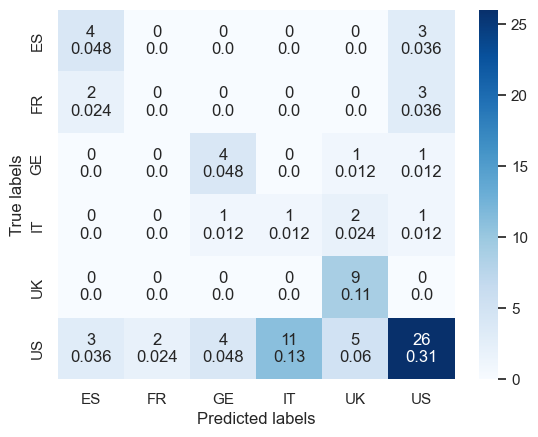

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |   0.444444  | 0.571429 |   0.5      |   7       |
| 1            |   0         | 0        |   0        |   5       |
| 2            |   0.444444  | 0.666667 |   0.533333 |   6       |
| 3            |   0.0833333 | 0.2      |   0.117647 |   5       |
| 4            |   0.529412  | 1        |   0.692308 |   9       |
| 5            |   0.764706  | 0.509804 |   0.611765 |  51       |
| accuracy     |   0.53012   | 0.53012  |   0.53012  |   0.53012 |
| macro avg    |   0.377723  | 0.491317 |   0.409175 |  83       |
| weighted avg |   0.601917  | 0.53012  |   0.538783 |  83       |
+--------------+-------------+----------+------------+-----------+


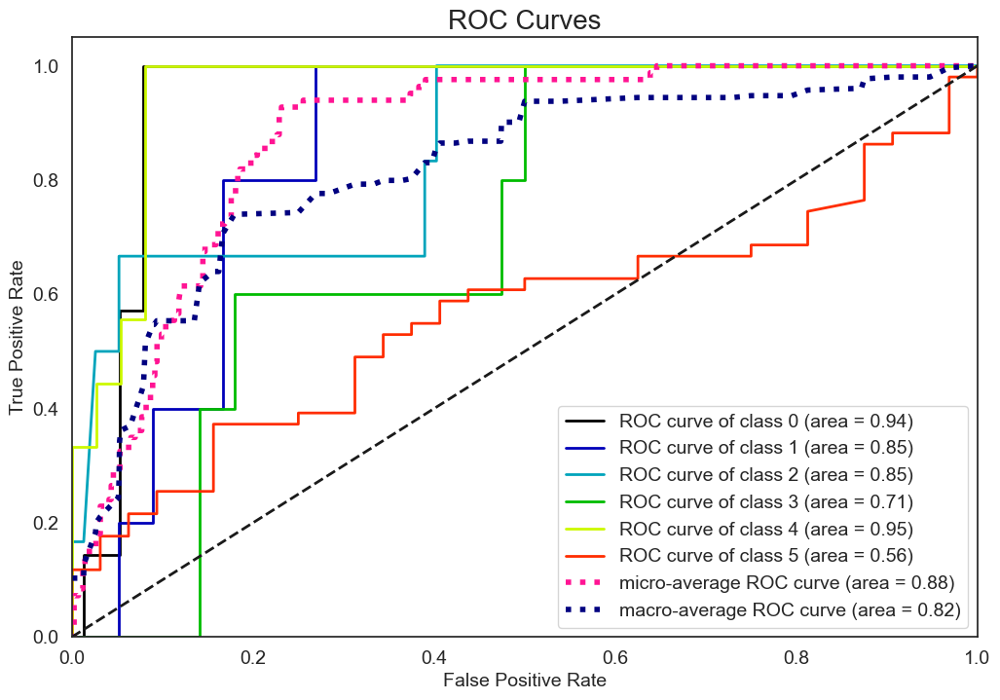

In [342]:
ada_clf = perform_experiment(ada_params, ada_pipeline);

In [343]:
ada_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ada', AdaBoostClassifier(base_estimator=DecisionTreeClassifier()))
])

<h2>AdaBoostClassifier(base_estimator=DecisionTreeClassifier())</h2>

Fitting 5 folds for each of 9 candidates, totalling 45 fits
+-------------------------------------------------------------+----------------------+---------------------+------------+
|                                                             |   ada__learning_rate |   ada__n_estimators |   accuracy |
|-------------------------------------------------------------+----------------------+---------------------+------------|
| AdaBoostClassifier(base_estimator=DecisionTreeClassifier()) |                  0.1 |                 100 |   0.646367 |
+-------------------------------------------------------------+----------------------+---------------------+------------+
f1_score = 0.6144578313253012
accuracy_score = 0.6144578313253012


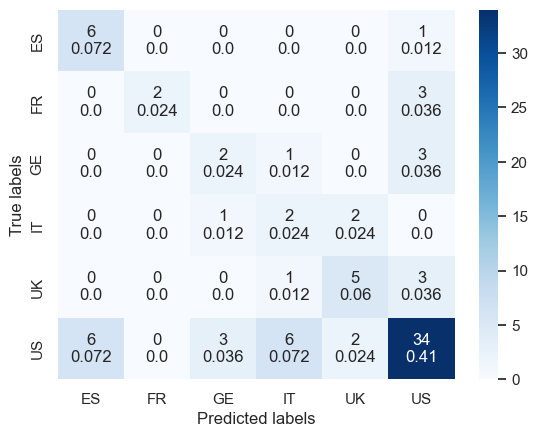

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    0.5      | 0.857143 |   0.631579 |  7        |
| 1            |    1        | 0.4      |   0.571429 |  5        |
| 2            |    0.333333 | 0.333333 |   0.333333 |  6        |
| 3            |    0.2      | 0.4      |   0.266667 |  5        |
| 4            |    0.555556 | 0.555556 |   0.555556 |  9        |
| 5            |    0.772727 | 0.666667 |   0.715789 | 51        |
| accuracy     |    0.614458 | 0.614458 |   0.614458 |  0.614458 |
| macro avg    |    0.560269 | 0.53545  |   0.512392 | 83        |
| weighted avg |    0.673604 | 0.614458 |   0.627913 | 83        |
+--------------+-------------+----------+------------+-----------+


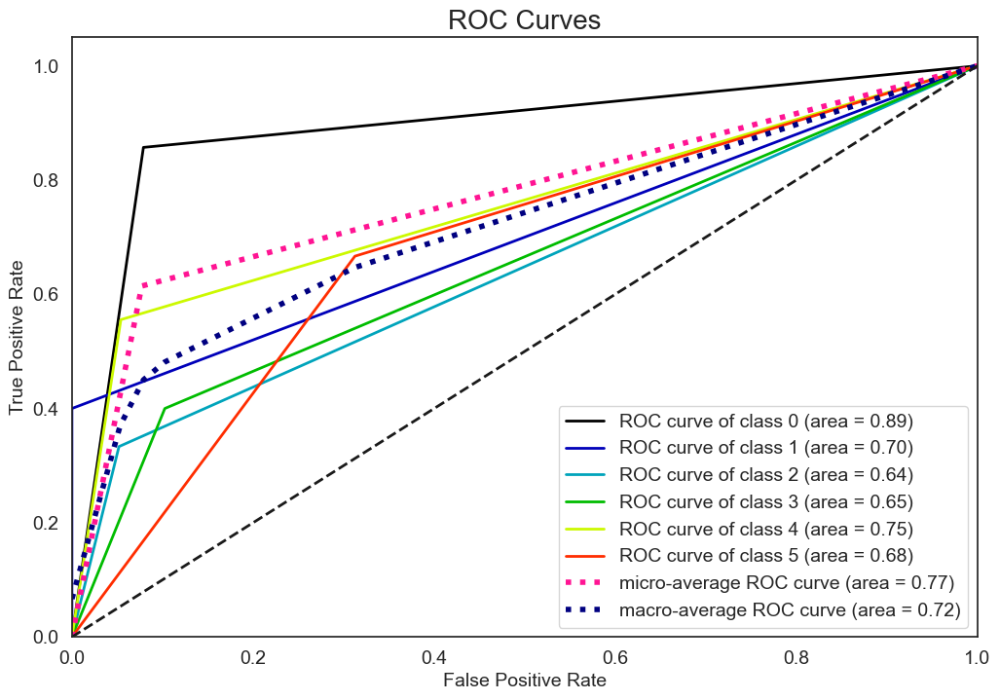

In [344]:
ada_clf = perform_experiment(ada_params, ada_pipeline);

<h2>AdaBoostClassifier(base_estimator=LogisticRegression())</h2>

Fitting 5 folds for each of 9 candidates, totalling 45 fits
+---------------------------------------------------------+----------------------+---------------------+------------+
|                                                         |   ada__learning_rate |   ada__n_estimators |   accuracy |
|---------------------------------------------------------+----------------------+---------------------+------------|
| AdaBoostClassifier(base_estimator=LogisticRegression()) |                  0.5 |                  50 |   0.629959 |
+---------------------------------------------------------+----------------------+---------------------+------------+
f1_score = 0.6144578313253012
accuracy_score = 0.6144578313253012


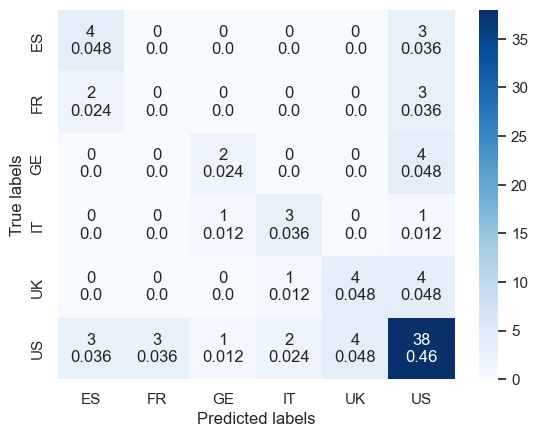

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    0.444444 | 0.571429 |   0.5      |  7        |
| 1            |    0        | 0        |   0        |  5        |
| 2            |    0.5      | 0.333333 |   0.4      |  6        |
| 3            |    0.5      | 0.6      |   0.545455 |  5        |
| 4            |    0.5      | 0.444444 |   0.470588 |  9        |
| 5            |    0.716981 | 0.745098 |   0.730769 | 51        |
| accuracy     |    0.614458 | 0.614458 |   0.614458 |  0.614458 |
| macro avg    |    0.443571 | 0.449051 |   0.441135 | 83        |
| weighted avg |    0.59852  | 0.614458 |   0.603998 | 83        |
+--------------+-------------+----------+------------+-----------+


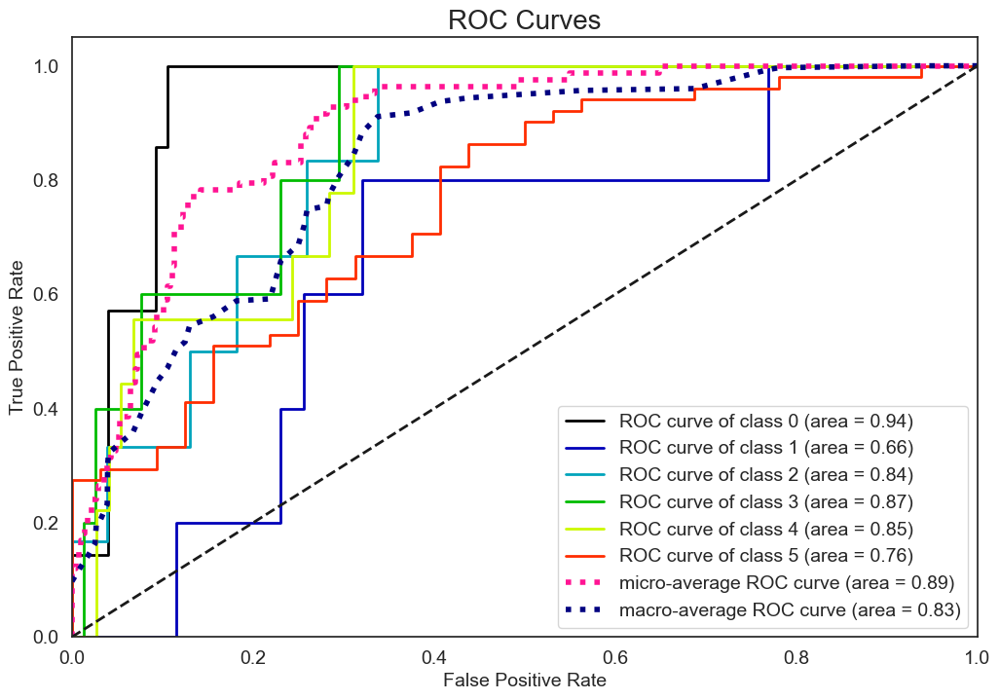

In [345]:
from sklearn.linear_model import LogisticRegression
ada_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ada', AdaBoostClassifier(base_estimator=LogisticRegression()))
])

ada_clf = perform_experiment(ada_params, ada_pipeline);

<h2>AdaBoostClassifier(algorithm='SAMME', base_estimator=SGDClassifier())</h2>

Fitting 5 folds for each of 9 candidates, totalling 45 fits
+-----------------------------------------------------------------------+----------------------+---------------------+------------+
|                                                                       |   ada__learning_rate |   ada__n_estimators |   accuracy |
|-----------------------------------------------------------------------+----------------------+---------------------+------------|
| AdaBoostClassifier(algorithm='SAMME', base_estimator=SGDClassifier()) |                    1 |                 100 |   0.784735 |
+-----------------------------------------------------------------------+----------------------+---------------------+------------+
f1_score = 0.7228915662650603
accuracy_score = 0.7228915662650602


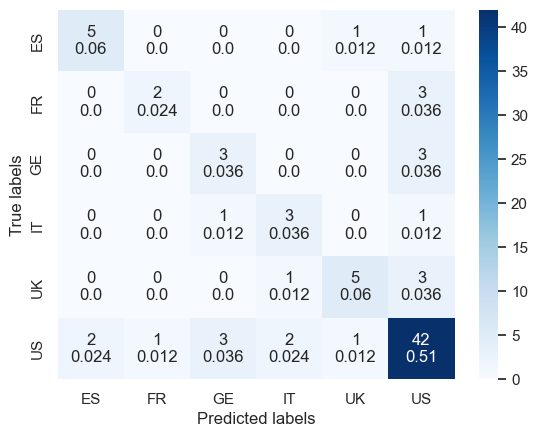

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    0.714286 | 0.714286 |   0.714286 |  7        |
| 1            |    0.666667 | 0.4      |   0.5      |  5        |
| 2            |    0.428571 | 0.5      |   0.461538 |  6        |
| 3            |    0.5      | 0.6      |   0.545455 |  5        |
| 4            |    0.714286 | 0.555556 |   0.625    |  9        |
| 5            |    0.792453 | 0.823529 |   0.807692 | 51        |
| accuracy     |    0.722892 | 0.722892 |   0.722892 |  0.722892 |
| macro avg    |    0.636044 | 0.598895 |   0.608995 | 83        |
| weighted avg |    0.725885 | 0.722892 |   0.720648 | 83        |
+--------------+-------------+----------+------------+-----------+


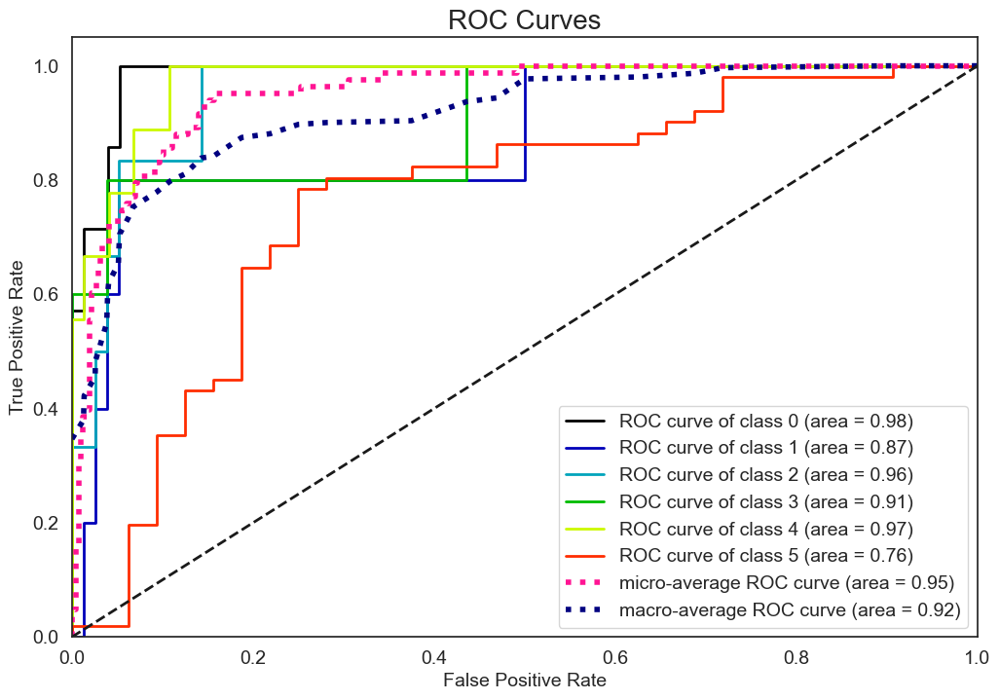

In [346]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
ada_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ada', AdaBoostClassifier(base_estimator=SGDClassifier(loss='hinge'), algorithm='SAMME'))
])

ada_clf = perform_experiment(ada_params, ada_pipeline);

<h2>GradientBoostingClassifier()</h2>

Fitting 5 folds for each of 27 candidates, totalling 135 fits
+------------------------------+---------------------+-----------------+--------------------+------------+
|                              |   gb__learning_rate |   gb__max_depth |   gb__n_estimators |   accuracy |
|------------------------------+---------------------+-----------------+--------------------+------------|
| GradientBoostingClassifier() |                 0.1 |               4 |                100 |    0.79698 |
+------------------------------+---------------------+-----------------+--------------------+------------+
f1_score = 0.783132530120482
accuracy_score = 0.7831325301204819


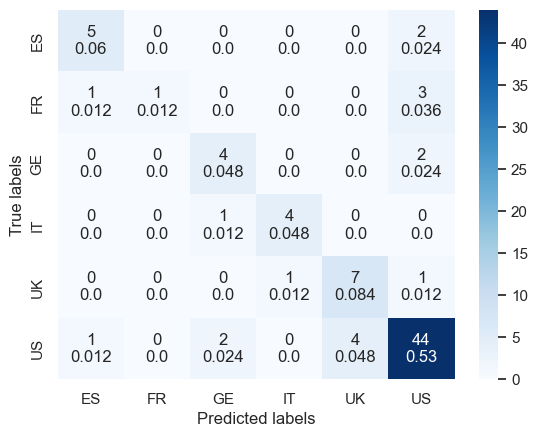

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    0.714286 | 0.714286 |   0.714286 |  7        |
| 1            |    1        | 0.2      |   0.333333 |  5        |
| 2            |    0.571429 | 0.666667 |   0.615385 |  6        |
| 3            |    0.8      | 0.8      |   0.8      |  5        |
| 4            |    0.636364 | 0.777778 |   0.7      |  9        |
| 5            |    0.846154 | 0.862745 |   0.854369 | 51        |
| accuracy     |    0.783133 | 0.783133 |   0.783133 |  0.783133 |
| macro avg    |    0.761372 | 0.670246 |   0.669562 | 83        |
| weighted avg |    0.798912 | 0.783133 |   0.773877 | 83        |
+--------------+-------------+----------+------------+-----------+


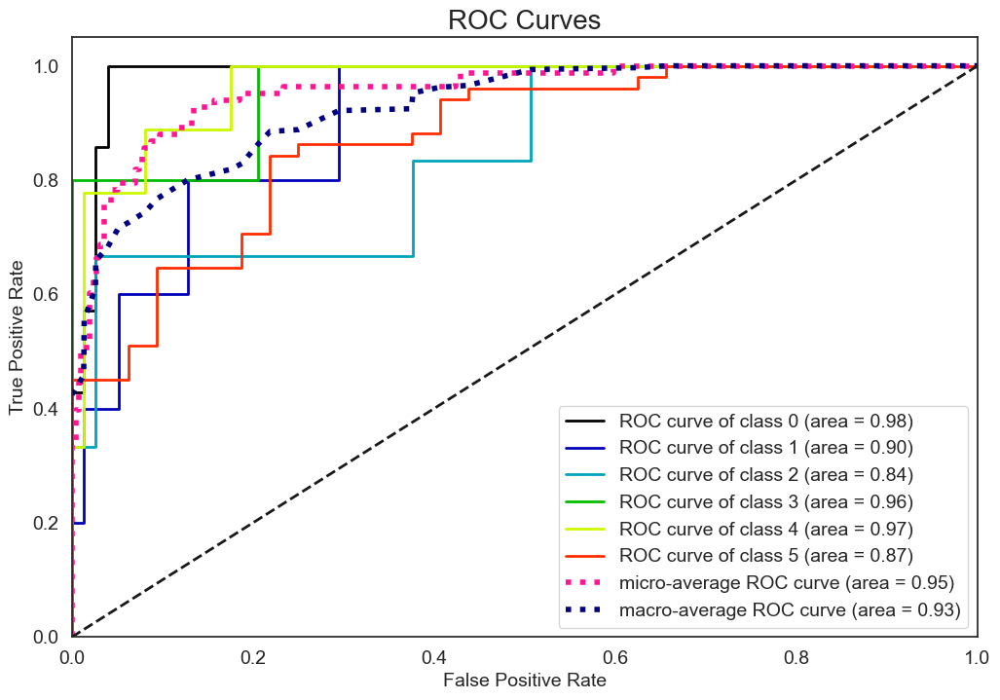

In [347]:
gb_clf = perform_experiment(gb_params, gb_pipeline);

<h2>BaggingClassifier()</h2>

Fitting 5 folds for each of 27 candidates, totalling 135 fits
+---------------------+---------------------+--------------------+---------------------+------------+
|                     |   bag__max_features |   bag__max_samples |   bag__n_estimators |   accuracy |
|---------------------+---------------------+--------------------+---------------------+------------|
| BaggingClassifier() |                 0.8 |                0.8 |                  50 |   0.768327 |
+---------------------+---------------------+--------------------+---------------------+------------+
f1_score = 0.7951807228915663
accuracy_score = 0.7951807228915663


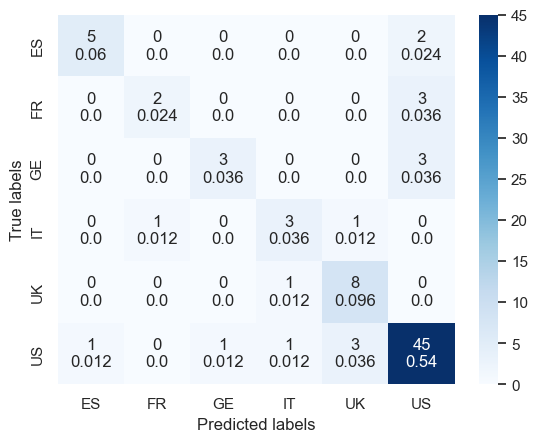

+--------------+-------------+----------+------------+-----------+
|              |   precision |   recall |   f1-score |   support |
|--------------+-------------+----------+------------+-----------|
| 0            |    0.833333 | 0.714286 |   0.769231 |  7        |
| 1            |    0.666667 | 0.4      |   0.5      |  5        |
| 2            |    0.75     | 0.5      |   0.6      |  6        |
| 3            |    0.6      | 0.6      |   0.6      |  5        |
| 4            |    0.666667 | 0.888889 |   0.761905 |  9        |
| 5            |    0.849057 | 0.882353 |   0.865385 | 51        |
| accuracy     |    0.795181 | 0.795181 |   0.795181 |  0.795181 |
| macro avg    |    0.727621 | 0.664255 |   0.682753 | 83        |
| weighted avg |    0.794802 | 0.795181 |   0.788872 | 83        |
+--------------+-------------+----------+------------+-----------+


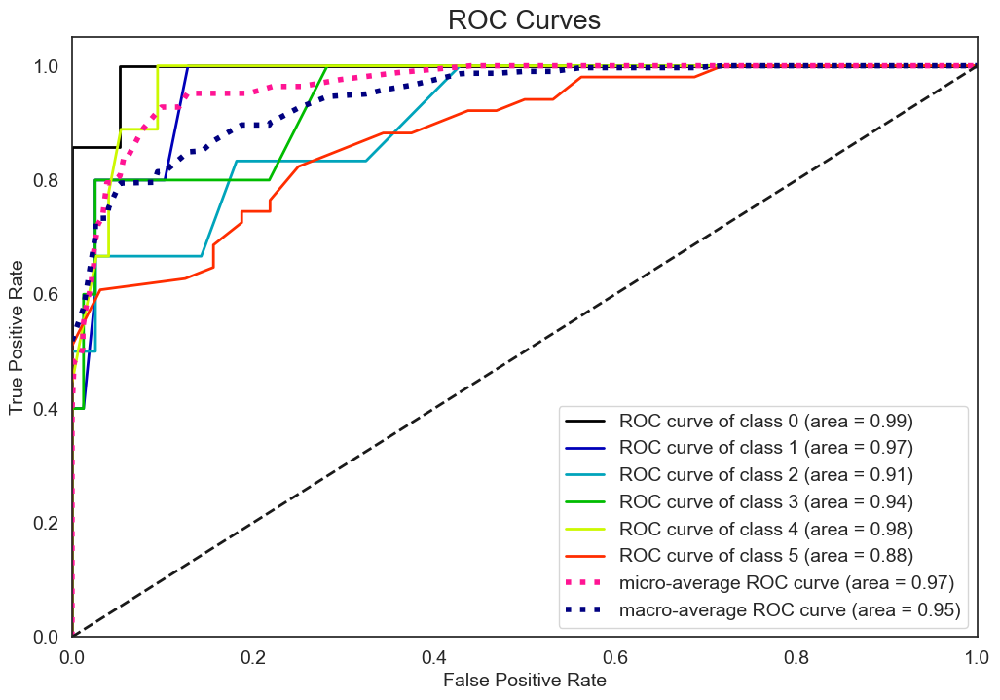

In [348]:
bag_clf = perform_experiment(bag_params, bag_pipeline);

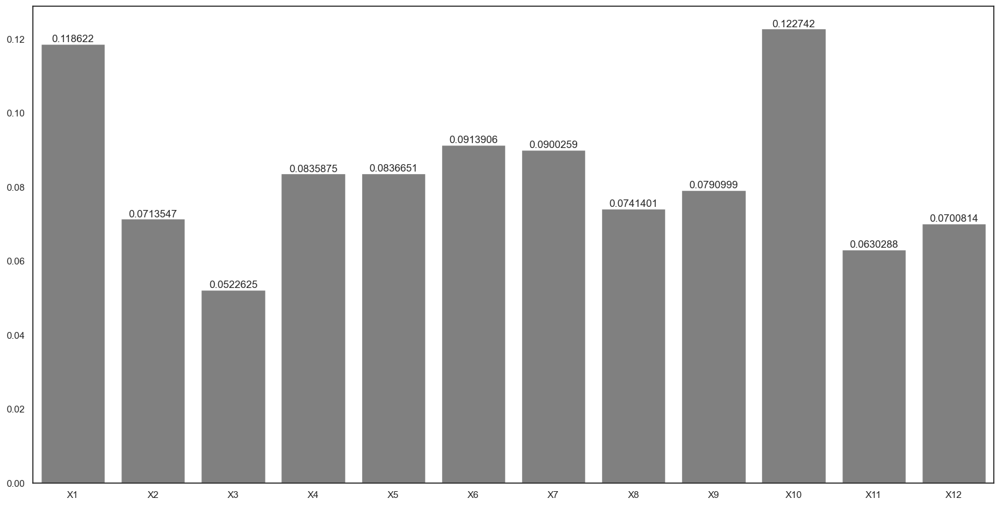

In [349]:
plt.figure(figsize=(20, 10))
ax = sns.barplot(x=rf_clf.feature_names_in_, y=rf_clf['rf'].feature_importances_, color='gray')
ax.bar_label(ax.containers[0]);

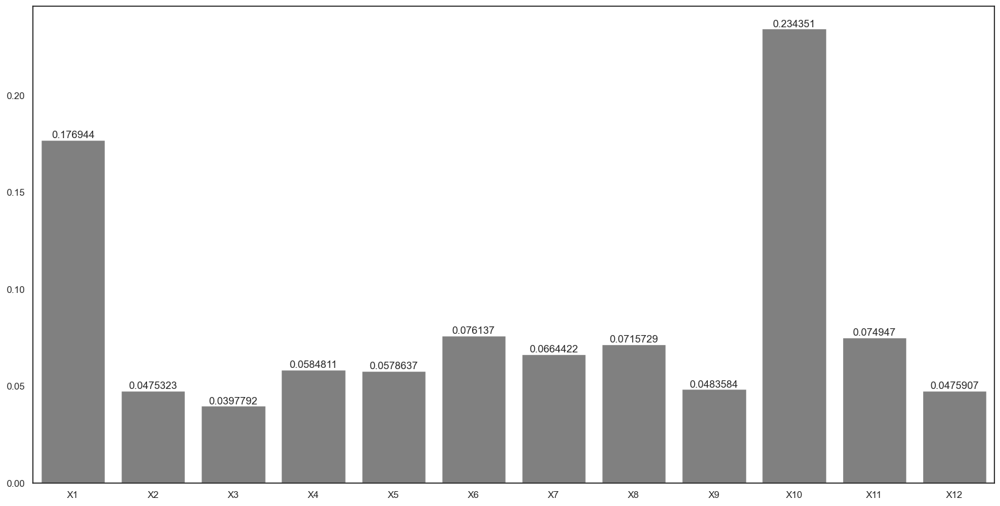

In [352]:
plt.figure(figsize=(20, 10))
ax = sns.barplot(x=gb_clf.feature_names_in_, y=gb_clf['gb'].feature_importances_, color='gray')
ax.bar_label(ax.containers[0]);

В этом случае метрики несколько деградировали. Значительную роль здесь играет несбаланированность классов. Так же можно заметить, что AdaBoost с SVM и LogisticRegression результаты значительно лучше, чем с деревом, это может означать, что классы лучше разделимы линейно. В целом, лучше всего себя показаали RandomForest и BaggingClassifier, отличительными чертами которых является бутстраппирование. Мало смысла имеет переходить в пространства с меньшей корреляцией, потому что признаки итак несильно скоррелированы. 

**Задание 2** (5 баллов) 

Получите оценку параметров нормального распределения из принципа максимума правдоподобия.


Нормальное распределение:

$$ f(x) = \dfrac{1}{\sigma\sqrt{2\pi}} e^{-\dfrac{(x-\mu)^2}{2\sigma^2}}$$

Функция правдоподобия:

$$L(x; \mu, \sigma) = \prod\limits_{i=1}^n \dfrac{1}{\sigma\sqrt{2\pi}} e^{-\dfrac{(x-\mu)^2}{2\sigma^2}}$$

Логарифм функции правдоподобия:

$$ \ln L(x; \mu, \sigma) = \sum\limits_{i=1}^n \left(\ln \left(\dfrac{1}{\sigma\sqrt{2\pi}}\right) - \dfrac{(x-\mu)^2}{2\sigma^2}\right) = \\[0.5cm]
     = -\dfrac{n}{2} \ln(2\pi) - \dfrac{n}{2}\ln \sigma^2 - \dfrac{\sum\limits_{i=1}^n (x-\mu)^2}{2\sigma^2}$$
Найдем оценку среднего. Для этого продифференцируем логарифм правдоподобия по $\mu$:

$$\dfrac{\partial L(x; \mu, \sigma)}{\partial \mu} = \dfrac{1}{\sigma^2}\sum\limits_{i=1}^n (x_i-\mu) = 0 \Longrightarrow \\[0.5cm] \Rightarrow \sum\limits_{i=1}^n (x_i) - n\mu = 0 \Rightarrow \hat{\mu} = \dfrac{1}{n}\sum\limits_{i=1}^n x_i.$$

Найдем оценку дисперсии. Для этого продифференицруем по $\sigma$:

$$\dfrac{\partial L(x; \mu, \sigma)}{\partial \sigma} = \dfrac{n}{\sigma} + \dfrac{1}{\sigma^3}\sum\limits_{i=1}^n (x_i - \mu)^2 = 0 \\[0.5cm] \hat{\sigma} = \sqrt{\displaystyle \dfrac{1}{n}\sum\limits_{i=1}^n (x_i - \mu)^2}$$

**Задание 3** (15 баллов) 

Постройте рекомендательную систему фильмов на датасете [Movie Lens](http://grouplens.org/datasets/movielens/). В качестве данных обучения можно использовать файлы с расширением base, а тестирование качества провести на файле test: пары файлов u1.base и u1.test, ..., u5.base и u5.test. Каждая пара -- это разбиение 80%/20%  данных для всех пользователей $u$ на обучащие и тестовые данные. 

Реализуйте вычисление ошибок MAE и RMSE, и постройте графики зависимости MAE и RMSE от числа соседей (диапазон от 1 до 100 с разумным шагом). 
Вопросы:
1. Как изменяется величина MAE (RMSE) от числа выдаваемых рекомендаций (top-n): $n \in \{1,3,5,10,15,20,30,40,50,100\}$? 
2. Как Вы считаете, какие фильмы чаще рекомендуются -- популярные с высокими оценками или редкие (те, которые редко оцениваются) с высокими оценками?
3. Что делать, если соседей (то есть похожих на целевого пользователя или конкретный товар) мало? Нужно/можно ли как-то учитывать достоверность таких рекомендаций? 

Ниже некоторый вспомогательный код для работы с датасетом, который можно использовать в той или иной мере, а можно вообще убрать и написать по-своему. 

In [359]:
from math import sqrt
# Returns the Pearson correlation coefficient for p1 and p2
def sim_pearson(prefs,p1,p2):
 # Get the list of mutually rated items
    si={}
    for item in prefs[p1]: 
        if item in prefs[p2]: si[item]=1

     # if they are no ratings in common, return 0
    if len(si)==0: return 0

    # The number of mutually rated movies
    n=len(si)
  
    # Sums of all the preferences
    sum1=sum([prefs[p1][it] for it in si])
    sum2=sum([prefs[p2][it] for it in si])
    # Sums of the squares
    sum1Sq=sum([pow(prefs[p1][it],2) for it in si])
    sum2Sq=sum([pow(prefs[p2][it],2) for it in si])	
  
     # Sum of the products
    pSum=sum([prefs[p1][it]*prefs[p2][it] for it in si]) #scalar product
  
     # Calculate r (Pearson score)
    num=pSum-(sum1*sum2/n)
    den=sqrt((sum1Sq-pow(sum1,2)/n)*(sum2Sq-pow(sum2,2)/n))
    if den==0: return 0

    r=num/den

    return r

In [360]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm


def topMatches(prefs,person,n=5,similarity=sim_pearson):
    scores=[(similarity(prefs,person,other),other)
    for other in prefs if other!=person]
    # Descending sorting
    scores.sort( )
    scores.reverse( )
    return scores[0:n]

def getNRecommendations(prefs, person, n: int, similarity=sim_pearson):
    totals = {}
    simSums = {}
    # print(person, prefs)
    n_closest = topMatches(prefs, person, n)
    for i, other in n_closest:
        if other == person: continue
        sim = similarity(prefs, person, other)
        if sim <= 0: continue
        for item in prefs[other]:
            if item not in prefs[person] or prefs[person][item] == 0:
                totals.setdefault(item, 0)
                totals[item] += sim * prefs[other][item] 
                simSums.setdefault(item,0)
                simSums[item]+=sim
    rankings=[(total/simSums[item],item) for item,total in totals.items( )]
    rankings.sort(reverse=True)
    return rankings

In [361]:
def loadMovieLens_train_test(path='data/ml-100k/', i:int = 1):
# Get movie titles
    movies={}
    for line in open(path+'/u.item'):
        (id,title)=line.split('|')[0:2]
        movies[id]=title
 # Load data
    prefs_train = {}
    for line in open(path+f'/u{i}.base'):
        (user,movieid,rating,ts)=line.split('\t')
        prefs_train.setdefault(user,{})
        prefs_train[user][movies[movieid]]=float(rating)
    prefs_test = {}
    for line in open(path+f'/u{i}.test'):
        (user,movieid,rating,ts)=line.split('\t')
        prefs_test.setdefault(user,{})
        prefs_test[user][movies[movieid]]=float(rating)
    return prefs_train, prefs_test

In [362]:
def error(y_test, preds, type_="mae"):
    preds = dict((x, y) for y, x in preds)

    res = 0

    for m, r in y_test.items():
        if m in preds.keys():
            res += abs(r - preds[m]) if type_ == "mae" else (r - preds[m])**2
        else:
            res += abs(r) if type_ == "mae" else r**2
    res = res / len(y_test)
    if type_=="rmse":
        res = res ** 0.5
    return res

In [364]:
n_neighbours = np.linspace(1, 100, 10).astype(int)
mae_scores_ub = [0 for _ in n_neighbours]
rmse_scores_ub = [0 for _ in n_neighbours]
for i in tqdm(range(1, 6)):
    train, test = loadMovieLens_train_test(i=i)
    for j, n in tqdm(enumerate(n_neighbours)):
        mae, rmse = 0, 0
        for person in test.keys():
            recs = getNRecommendations(train, person, n)
            mae += error(test[person], recs)
            rmse += error(test[person], recs, "rmse")
        mae_scores_ub[j] += mae / len(test.keys())
        rmse_scores_ub[j] += rmse / len(test.keys())   

for i in range(len(mae_scores_ub)):
    mae_scores_ub[i] /= 5
    rmse_scores_ub[i] /= 5 

10it [02:39, 15.95s/it]0:00<?, ?it/s]
10it [04:08, 24.85s/it]2:39<10:38, 159.70s/it]
10it [05:37, 33.74s/it]6:48<10:36, 212.05s/it]
10it [04:53, 29.36s/it]2:25<08:58, 269.35s/it]
10it [02:36, 15.61s/it]7:19<04:38, 278.99s/it]
100%|██████████| 5/5 [19:55<00:00, 239.18s/it]


In [365]:
def transformPrefs(prefs):
    result={}
    for person in prefs:
        for item in prefs[person]:
            result.setdefault(item,{})
    # Flip item and person
    
            result[item][person]=prefs[person][item]
    return result

In [372]:
from math import sqrt
# Returns a distance-based similarity score for person1 and person2
def sim_distance(prefs,person1,person2):
# Get the list of shared_items
    si={}
    for item in prefs[person1]:
        if item in prefs[person2]:
            si[item]=1
# if they have no ratings in common, return 0
    if len(si)==0: return 0
# Add up the squares of all the differences
    sum_of_squares=sum([pow(prefs[person1][item]-prefs[person2][item],2)
    for item in prefs[person1] if item in prefs[person2]])
    return 1/(1+sum_of_squares)

In [373]:
def calculateSimilarItems(prefs,n=10):
    # Create a dictionary of items showing which other items they
  # are most similar to.
    result={}
    # Invert the preference matrix to be item-centric
    itemPrefs=transformPrefs(prefs)
    c=0
    for item in itemPrefs:
    # Status updates for large datasets
        c+=1
        if c%100==0: print("%d / %d" % (c,len(itemPrefs)))
    # Find the most similar items to this one
        scores=topMatches(itemPrefs,item,n=n,similarity=sim_distance)
        result[item]=scores
    return result

In [374]:
def getRecommendedItems(prefs,itemMatch,user):
    userRatings=prefs[user]
    scores={}
    totalSim={}

    # Loop over items rated by this user
    for (item,rating) in userRatings.items():
        
    # Loop over items similar to this one
        for (similarity,item2) in itemMatch[item]:
    # Ignore if this user has already rated this item
            if item2 in userRatings: continue
         # Weighted sum of rating times similarity
            scores.setdefault(item2,0)
            scores[item2]+=similarity*rating
         # Sum of all the similarities
            totalSim.setdefault(item2,0)
            totalSim[item2]+=similarity
            if totalSim[item2]==0: totalSim[item2]=0.0000001 # to avoid divison by zero
    # Divide each total score by total weighting to get an average
    rankings=[(score/totalSim[item],item) for item,score in scores.items( ) ]

    # Return the rankings from highest to lowest
    rankings.sort( )
    rankings.reverse( )
    return rankings

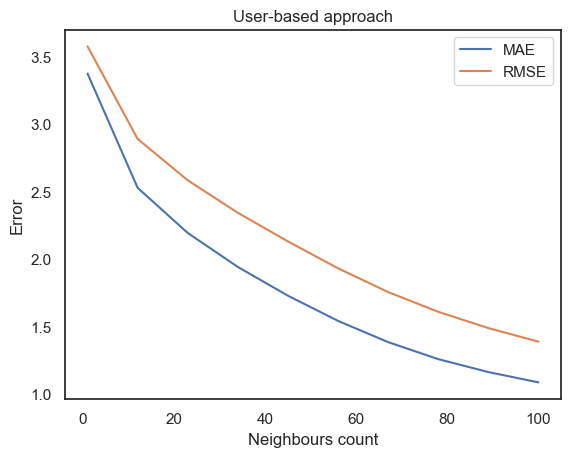

In [375]:
plt.plot(n_neighbours, mae_scores_ub, label="MAE")
plt.plot(n_neighbours, rmse_scores_ub, label="RMSE")
plt.xlabel("Neighbours count")
plt.ylabel("Error")
plt.title("User-based approach")
plt.legend()

In [376]:
mae_scores_ib = [0 for _ in n_neighbours]
rmse_scores_ib = [0 for _ in n_neighbours]
for i in tqdm(range(1,6)):
    train, test = loadMovieLens_train_test(i=i)
    for j, n in enumerate(n_neighbours):
        items = calculateSimilarItems(train, n)
        mae, rmse = 0, 0
        for person in test.keys():
            recs = getRecommendedItems(train, items, person)
            mae += error(test[person], recs)
            rmse += error(test[person], recs, type_="rmse")
        mae_scores_ib[j] += mae / len(test.keys())
        rmse_scores_ib[j] += rmse / len(test.keys())


for i in range(len(mae_scores_ib)):
    mae_scores_ib[i] /= 5
    rmse_scores_ib[i] /= 5

  0%|          | 0/5 [00:00<?, ?it/s]

100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633
100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633
100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633
100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633
100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633
100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 16

 20%|██        | 1/5 [03:15<13:00, 195.19s/it]

100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630
100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630
100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630
100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630
100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630
100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 16

 40%|████      | 2/5 [06:26<09:39, 193.04s/it]

100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634
100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634
100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634
100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634
100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634
100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 16

 60%|██████    | 3/5 [09:55<06:40, 200.29s/it]

100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644
100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644
100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644
100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644
100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644
100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 16

 80%|████████  | 4/5 [13:28<03:25, 205.18s/it]

100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635
100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635
100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635
100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635
100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635
100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 16

100%|██████████| 5/5 [16:56<00:00, 203.29s/it]


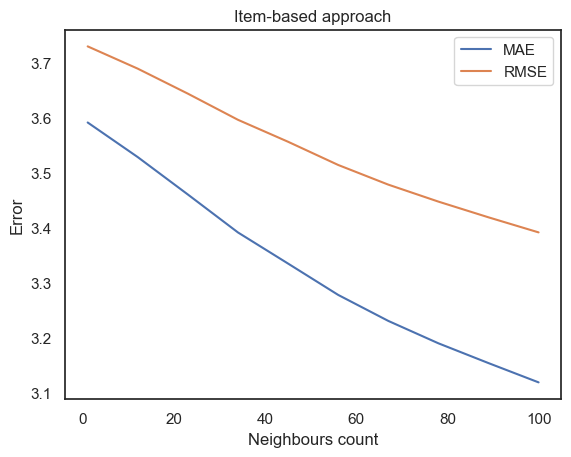

In [377]:
plt.plot(n_neighbours, mae_scores_ib, label="MAE")
plt.plot(n_neighbours, rmse_scores_ib, label="RMSE")
plt.xlabel("Neighbours count")
plt.ylabel("Error")
plt.title("Item-based approach")
plt.legend()

In [378]:
def getNRecommendations_nf1(prefs, person, n: int, similarity=sim_pearson):
    totals = {}
    simSums = {}
    r_m = np.array(list(prefs[person].values())).mean() 
    n_closest = topMatches(prefs, person, n)
    for i, other in n_closest:
        ri_m = np.array(list(prefs[other].values())).mean()
        if other == person: continue
        sim = similarity(prefs, person, other)
        if sim <= 0: continue
        for item in prefs[other]:
            if item not in prefs[person] or prefs[person][item] == 0:
                totals.setdefault(item, 0)
                totals[item] += sim * (prefs[other][item] - ri_m)
                simSums.setdefault(item,0)
                simSums[item] += sim
    rankings=[(r_m + total/simSums[item],item) for item,total in totals.items()]
    rankings.sort(reverse=True)
    return rankings

def getNRecommendations_nf2(prefs, person, n: int, similarity=sim_pearson):
    totals = {}
    simSums = {}
    r_m = np.array(list(prefs[person].values())).mean() 
    sigma_u = np.array(list(prefs[person].values())).std()
    n_closest = topMatches(prefs, person, n)
    for i, other in n_closest:
        sigma_ui = np.array(list(prefs[other].values())).std()
        ri_m = np.array(list(prefs[other].values())).mean()
        if other == person: continue
        sim = similarity(prefs, person, other)
        if sim <= 0: continue
        for item in prefs[other]:
            if item not in prefs[person] or prefs[person][item] == 0:
                totals.setdefault(item, 0)
                totals[item] += sim * (prefs[other][item] - ri_m) / sigma_ui
                simSums.setdefault(item,0)
                simSums[item] += sim
    rankings=[(r_m + sigma_u * total/simSums[item],item) for item,total in totals.items()]
    rankings.sort(reverse=True)
    return rankings

In [379]:
n_neighbours = [1,3,5,10,15,20,30,40,50,100]

In [380]:
mae_scores_nf1 = [0 for _ in n_neighbours]
rmse_scores_nf1 = [0 for _ in n_neighbours]
for i in tqdm(range(1, 6)):
    train, test = loadMovieLens_train_test(i=i)
    for j, n in enumerate(n_neighbours):
        mae, rmse = 0, 0
        for person in test.keys():
            recs = getNRecommendations_nf1(train, person, n)
            mae += error(test[person], recs)
            rmse += error(test[person], recs, "rmse")
        mae_scores_nf1[j] += mae / len(test.keys())
        rmse_scores_nf1[j] += rmse / len(test.keys())   

for i in range(len(mae_scores_nf1)):
    mae_scores_nf1[i] /= 5
    rmse_scores_nf1[i] /= 5 

100%|██████████| 5/5 [22:56<00:00, 275.23s/it]


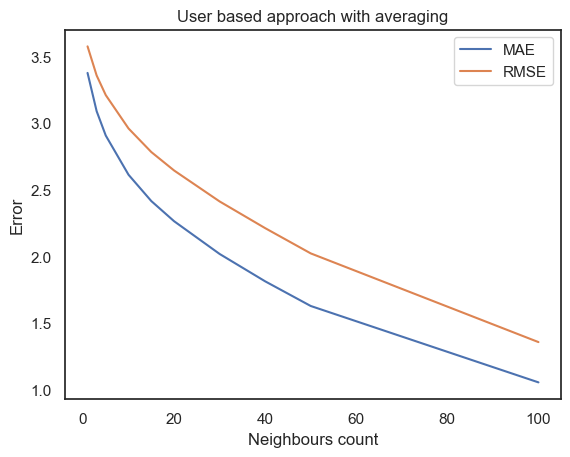

In [381]:
plt.plot(n_neighbours, mae_scores_nf1, label="MAE")
plt.plot(n_neighbours, rmse_scores_nf1, label="RMSE")
plt.xlabel("Neighbours count")
plt.ylabel("Error")
plt.title("User based approach with averaging")
plt.legend()

In [382]:
mae_scores_nf2 = [0 for _ in n_neighbours]
rmse_scores_nf2 = [0 for _ in n_neighbours]
for i in tqdm(range(1, 6)):
    train, test = loadMovieLens_train_test(i=i)
    for j, n in enumerate(n_neighbours):
        mae, rmse = 0, 0
        for person in test.keys():
            recs = getNRecommendations_nf2(train, person, n)
            mae += error(test[person], recs)
            rmse += error(test[person], recs, "rmse")
        mae_scores_nf2[j] += mae / len(test.keys())
        rmse_scores_nf2[j] += rmse / len(test.keys())   

for i in range(len(mae_scores_nf2)):
    mae_scores_nf2[i] /= 5
    rmse_scores_nf2[i] /= 5 

100%|██████████| 5/5 [10:45<00:00, 129.08s/it]


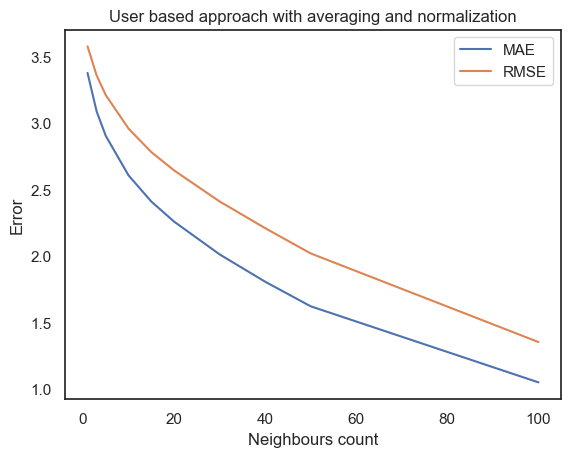

In [383]:
plt.plot(n_neighbours, mae_scores_nf2, label="MAE")
plt.plot(n_neighbours, rmse_scores_nf2, label="RMSE")
plt.xlabel("Neighbours count")
plt.ylabel("Error")
plt.title("User based approach with averaging and normalization")
plt.legend()

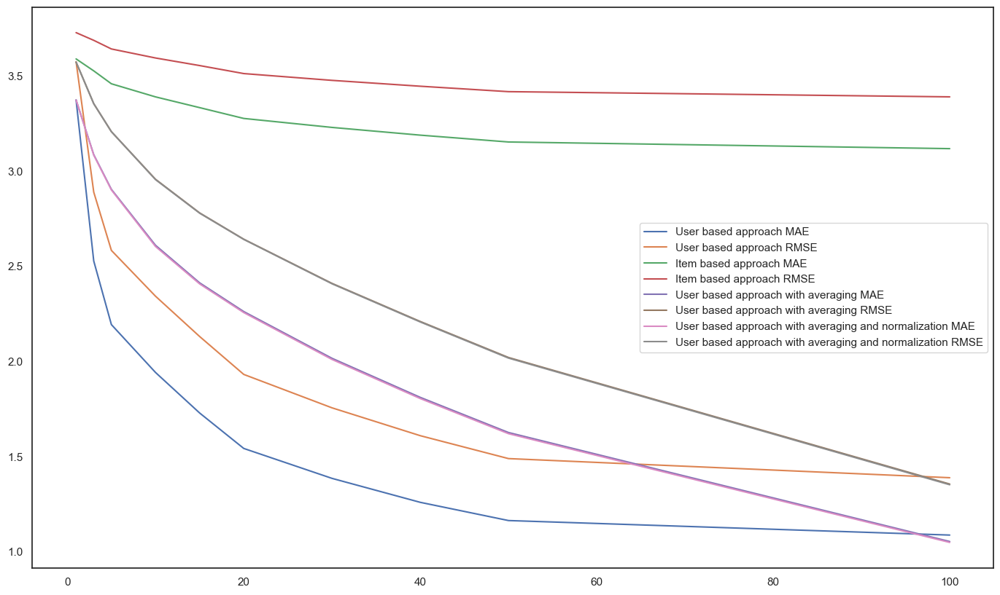

In [384]:
metrics = [
    (mae_scores_ub, rmse_scores_ub),
    (mae_scores_ib, rmse_scores_ib),
    (mae_scores_nf1, rmse_scores_nf1),
    (mae_scores_nf2, rmse_scores_nf2)
]

labels = [
    "User based approach",
    "Item based approach",
    "User based approach with averaging",
    "User based approach with averaging and normalization"
]
plt.figure(figsize=(17, 10))
for label, metric in zip(labels, metrics):
    plt.plot(n_neighbours, metric[0], label=label + " MAE")
    plt.plot(n_neighbours, metric[1], label=label + " RMSE")
plt.legend()

Помотрим, какие фильмы чаще рекомендуются

In [385]:
means = []
lens = []
for m, r in transformPrefs(train).items():
    means.append(np.array(list(r.values())).mean())
    lens.append(len(list(r.values())))

In [386]:
print("Popular movies: ", len([movie for movie, r in transformPrefs(train).items() if len(r) > 60]))
print("Unpopular movies: ", len([movie for movie, r in transformPrefs(train).items() if len(r) <= 60]))

Popular movies:  434
Unpopular movies:  1201


In [387]:
print("Popular highly rated movies: ", len([movie for movie, r in transformPrefs(train).items() if len(r) > 60 and np.mean(list(r.values())) > 3.5]))
print("Unpopular highly rated movies: ", len([movie for movie, r in transformPrefs(train).items() if len(r) <= 60 and np.mean(list(r.values())) > 3.5]))

Popular highly rated movies:  263
Unpopular highly rated movies:  272


In [388]:
train, test = loadMovieLens_train_test(i=1)
popular_movies = [movie for movie, r in transformPrefs(train).items() if len(r) > 50 and np.mean(list(r.values())) > 3.1]
unpopular_movies = [movie for movie, r in transformPrefs(train).items() if len(r) < 50 and np.mean(list(r.values())) > 3.1]

In [389]:
# Gets recommendations for a person by using a weighted average
# of every other user's rankings

def getRecommendations(prefs,person,similarity=sim_pearson):
    totals={}
    simSums={}
    for other in prefs:
     # don't compare me to myself
        if other==person: continue
        sim=similarity(prefs,person,other)
     # ignore scores of zero or lower
        if sim<=0: continue
        for item in prefs[other]:
    # only score movies I haven't seen yet
            if item not in prefs[person] or prefs[person][item]==0:
     # Similarity * Score
                totals.setdefault(item,0)
                totals[item]+=prefs[other][item]*sim
        # Sum of similarities
                simSums.setdefault(item,0)
                simSums[item]+=sim
     # Create the normalized list
    rankings=[(total/simSums[item],item) for item,total in totals.items( )]
    # Return the sorted list
    rankings.sort( )
    rankings.reverse( )
    return rankings

In [390]:
pop = 0
unpop = 0
for person in tqdm(list(train.keys())):
    recs = getRecommendations(train, person)[:20]
    for r, m in recs:
        if m in popular_movies:
            pop += 1
        elif m in unpopular_movies:
            unpop += 1

100%|██████████| 943/943 [00:27<00:00, 34.61it/s]


In [391]:
round(pop/(pop+unpop), 2), round(unpop/(pop+unpop), 2)

(0.11, 0.89)

In [392]:
betas = np.linspace(0.1, 1, 10)


mae_scores_nf2 = [0 for _ in betas]
rmse_scores_nf2 = [0 for _ in betas]
for i in tqdm(range(1, 6)):
    train, test = loadMovieLens_train_test(i=i)
    sim = calculateSimilarItems(train, 50)
    for j, beta in enumerate(betas):
        mae, rmse = 0, 0
        for person in test.keys():
            recs = []
            recsU = getNRecommendations_nf2(train, person, 100)
            recsI = dict([(m, r) for r, m in getRecommendedItems(train, sim, person)])

            for ru, m in recsU:
                if m in recsI.keys():
                    ri = recsI[m]
                else: 
                    ri = 0
                recs.append((beta * ru + (1-beta) * ri, m))
            mae += error(test[person], recs)
            rmse += error(test[person], recs, "rmse")
        mae_scores_nf2[j] += mae / len(test.keys())
        rmse_scores_nf2[j] += rmse / len(test.keys())   

for i in range(len(mae_scores_nf2)):
    mae_scores_nf2[i] /= 5
    rmse_scores_nf2[i] /= 5 

  0%|          | 0/5 [00:00<?, ?it/s]

100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633


 20%|██        | 1/5 [02:08<08:33, 128.42s/it]

100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630


 40%|████      | 2/5 [05:07<07:54, 158.14s/it]

100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634


 60%|██████    | 3/5 [08:59<06:23, 191.74s/it]

100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644


 80%|████████  | 4/5 [13:05<03:33, 213.50s/it]

100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635


100%|██████████| 5/5 [17:13<00:00, 206.61s/it]


In [393]:
mae_scores_nf2 = [0 for _ in betas]
rmse_scores_nf2 = [0 for _ in betas]
for i in tqdm(range(1, 6)):
    train, test = loadMovieLens_train_test(i=i)
    sim = calculateSimilarItems(train, 50)
    for j, beta in enumerate(betas):
        mae, rmse = 0, 0
        for person in test.keys():
            recs = []
            recsU = getNRecommendations_nf2(train, person, 100)
            recsI = dict([(m, r) for r, m in getRecommendedItems(train, sim, person)])

            for ru, m in recsU:
                if m in recsI.keys():
                    ri = recsI[m]
                else: 
                    ri = np.array(list(train[person].values())).mean()
                recs.append((beta * ru + (1-beta) * ri, m))
            mae += error(test[person], recs)
            rmse += error(test[person], recs, "rmse")
        mae_scores_nf2[j] += mae / len(test.keys())
        rmse_scores_nf2[j] += rmse / len(test.keys())   

for i in range(len(mae_scores_nf2)):
    mae_scores_nf2[i] /= 5
    rmse_scores_nf2[i] /= 5 

  0%|          | 0/5 [00:00<?, ?it/s]

100 / 1633
200 / 1633
300 / 1633
400 / 1633
500 / 1633
600 / 1633
700 / 1633
800 / 1633
900 / 1633
1000 / 1633
1100 / 1633
1200 / 1633
1300 / 1633
1400 / 1633
1500 / 1633
1600 / 1633


 20%|██        | 1/5 [02:26<09:47, 146.85s/it]

100 / 1630
200 / 1630
300 / 1630
400 / 1630
500 / 1630
600 / 1630
700 / 1630
800 / 1630
900 / 1630
1000 / 1630
1100 / 1630
1200 / 1630
1300 / 1630
1400 / 1630
1500 / 1630
1600 / 1630


 40%|████      | 2/5 [05:57<09:13, 184.42s/it]

100 / 1634
200 / 1634
300 / 1634
400 / 1634
500 / 1634
600 / 1634
700 / 1634
800 / 1634
900 / 1634
1000 / 1634
1100 / 1634
1200 / 1634
1300 / 1634
1400 / 1634
1500 / 1634
1600 / 1634


 60%|██████    | 3/5 [10:34<07:33, 226.57s/it]

100 / 1644
200 / 1644
300 / 1644
400 / 1644
500 / 1644
600 / 1644
700 / 1644
800 / 1644
900 / 1644
1000 / 1644
1100 / 1644
1200 / 1644
1300 / 1644
1400 / 1644
1500 / 1644
1600 / 1644


 80%|████████  | 4/5 [15:31<04:14, 254.37s/it]

100 / 1635
200 / 1635
300 / 1635
400 / 1635
500 / 1635
600 / 1635
700 / 1635
800 / 1635
900 / 1635
1000 / 1635
1100 / 1635
1200 / 1635
1300 / 1635
1400 / 1635
1500 / 1635
1600 / 1635


100%|██████████| 5/5 [20:31<00:00, 246.25s/it]


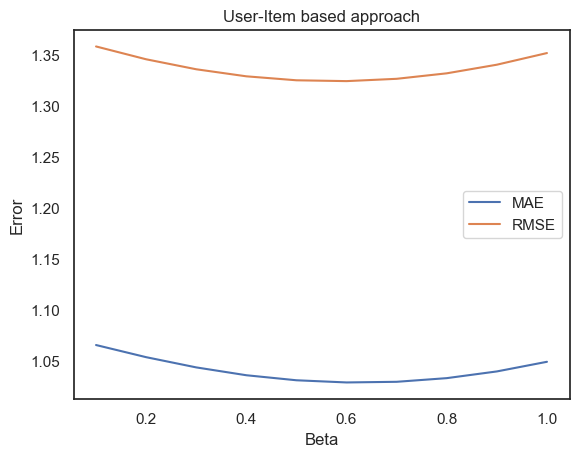

In [394]:
plt.plot(betas, mae_scores_nf2, label="MAE")
plt.plot(betas, rmse_scores_nf2, label="RMSE")
plt.xlabel("Beta")
plt.ylabel("Error")
plt.title("User-Item based approach")
plt.legend()